 <p style="padding:10px;background-color:white;margin:200;color:black;font-family:newtimeroman;font-size:400%;text-align:center;border-radius: 1500px 500px;overflow:hidden;font-weight:8000">🧠 Brain tumor Detection 🧠 </p>

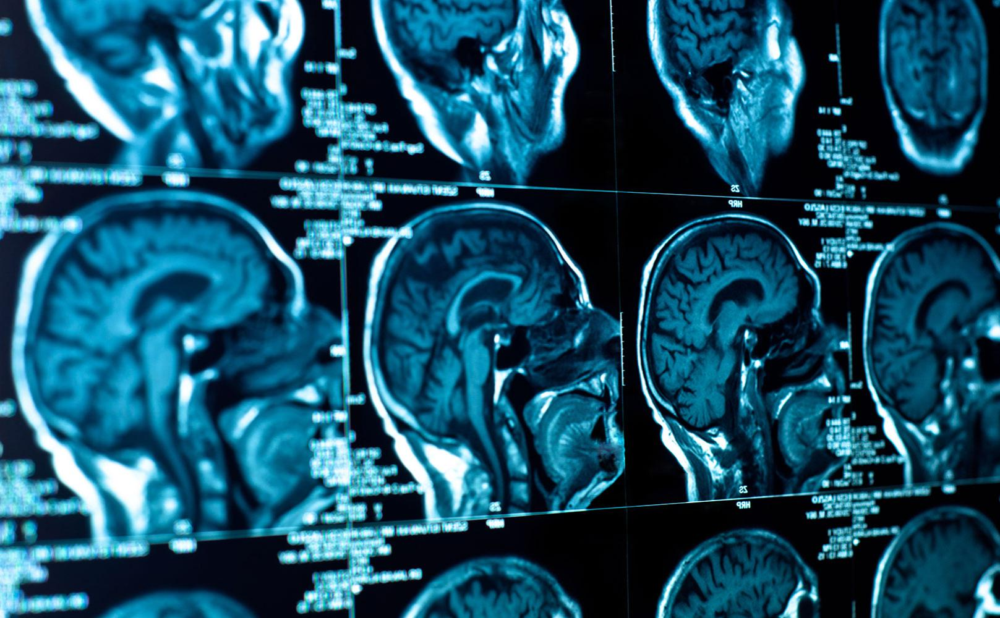

<span style="color:red;"><span style="font-size:15px;"><span style="font-weight:800;"><span style="font-size:15px;"> we can connect here😉 </span>   
[Let's Connect on LinkedIn!](https://www.linkedin.com/in/reza-mohit-6b1998218/)

 <p style="padding:10px;background-color:orange;margin:200;color:black;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 1500px 500px;overflow:hidden;font-weight:8000">Thanks for supporting me by upvotes😍🤝</p>

 <p style="color:navy;font-family:newtimeroman;font-size:500%;text-align:center; font-weight:8000">🏁Lets get started🏁</p>

<p style="color:navy;font-family:newtimeroman;font-size:200%;text-align:left; font-weight:80000">🔊 Introduction</p>
<p style="color:black;font-family:newtimeroman;font-size:130%;text-align:left; font-weight:80000">In this project, we aim to detect three types of brain tumors using both object detection and segmentation techniques. We will employ three algorithms: YOLOv11 for both object detection and segmentation, as well as SSD and Faster R-CNN. In each stage, we will visualize the results, evaluate these models, and, finally, compare their performance to select the most effective one.</p>

# <p style="padding:20px;background-color:black;margin:0;color:yellow;font-family:newtimeroman;font-size:120%;text-align:center;border-radius: 15px 500px;overflow:hidden;font-weight:800">🏁 Step 1 | Setup and Initialization</p>

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 921.5/921.5 kB 39.1 MB/s eta 0:00:00


In [2]:
# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import yaml
from ultralytics import YOLO
import copy
import torch
import torch.nn as nn
from torchvision.models import efficientnet_b3
from torchvision.models.feature_extraction import create_feature_extractor
from collections import OrderedDict
from torchvision.ops.feature_pyramid_network import FeaturePyramidNetwork
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.anchor_utils import AnchorGenerator
import torchvision
from torchvision.models import efficientnet_b3
from torchvision.models.feature_extraction import create_feature_extractor
import torch.optim as optim
from tqdm import tqdm
from torchvision.ops import nms
import torchvision.transforms as T
from torchvision.ops.boxes import box_iou
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torchvision.models.detection import ssd300_vgg16
import xml.etree.ElementTree as ET
import torchvision
import cv2
import xml.etree.ElementTree as ET
from collections import OrderedDict
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import torchvision.transforms.functional as F
from torch.utils.data import Dataset, DataLoader
from PIL import Image  
from torchvision.models import efficientnet_b3
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import seaborn as sns
from collections import Counter
from IPython.display import Video

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


# <p style="padding:20px;background-color:black;margin:0;color:yellow;font-family:newtimeroman;font-size:120%;text-align:center;border-radius: 15px 500px;overflow:hidden;font-weight:800">🧪 Step 2  | Dataset Explanation</p>

<p style="color:navy; font-family:newtimeroman; font-size:230%; text-align:left; font-weight:800;">
🔎 Data Explanation
</p>

<table style="width:100%; border-collapse:separate; border-spacing:0 15px; font-family:newtimeroman; font-size:150%; color:black;">
  <tr>
    <td style="font-weight:bold; padding:10px;">🟢 Glioma tumor </td>
    <td style="padding:10px;">Glioma is a growth of cells that starts in the brain or spinal cord. The cells in a glioma look similar to healthy brain cells called glial cells. Glial cells surround nerve cells and help them function. As a glioma grows it forms a mass of cells called a tumor</td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🟢 Meningioma tumor</td>
    <td style="padding:10px;">A meningioma tumor is a type of brain tumor that arises from the meninges, the protective membranes covering the brain and spinal cord. It is usually benign (non-cancerous) but can sometimes be atypical or malignant (cancerous).</td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🟢 Pituitary tumor</td>
    <td style="padding:10px;">
      A pituitary tumor is an abnormal growth in the pituitary gland, a small gland at the base of the brain responsible for regulating hormones. These tumors can affect hormone production and cause a variety of symptoms
    </td>
  <tr>
    <td style="font-weight:bold; padding:10px;">🔴 TARGET</td>
    <td style="padding:10px;">find cancerous part in MRI and detect them with Boundary box and Segmentation</td>
  </tr>
</table>


# <p style="padding:20px;background-color:black;margin:0;color:yellow;font-family:newtimeroman;font-size:120%;text-align:center;border-radius: 15px 500px;overflow:hidden;font-weight:800">👀 Step 3  | Dataset Overview </p>

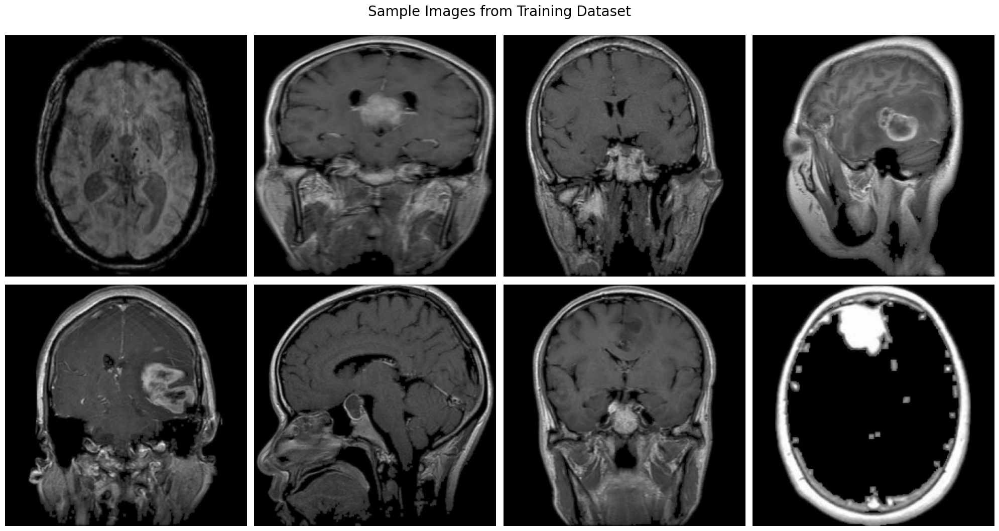

In [8]:
# List all jpg images in the directory

dataset_path = '/kaggle/input/brain-tumor-object-detection-segmentation'
train_images_path = os.path.join(dataset_path, 'train', 'images')
image_files = [file for file in os.listdir(train_images_path) if file.endswith('.jpg')]

# Select 8 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

# Create a 2x4 subplot
fig, axes = plt.subplots(2, 4, figsize=(20, 11))

# Display each of the selected images
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path = os.path.join(train_images_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')  

plt.suptitle('Sample Images from Training Dataset', fontsize=20)
plt.tight_layout()
plt.show()

 <p style="color:navy;font-family:newtimeroman;font-size:250%;text-align:center; font-weight:8000"> 🔎 Now lets show the cancerous parts of the brain 🔎 </p>

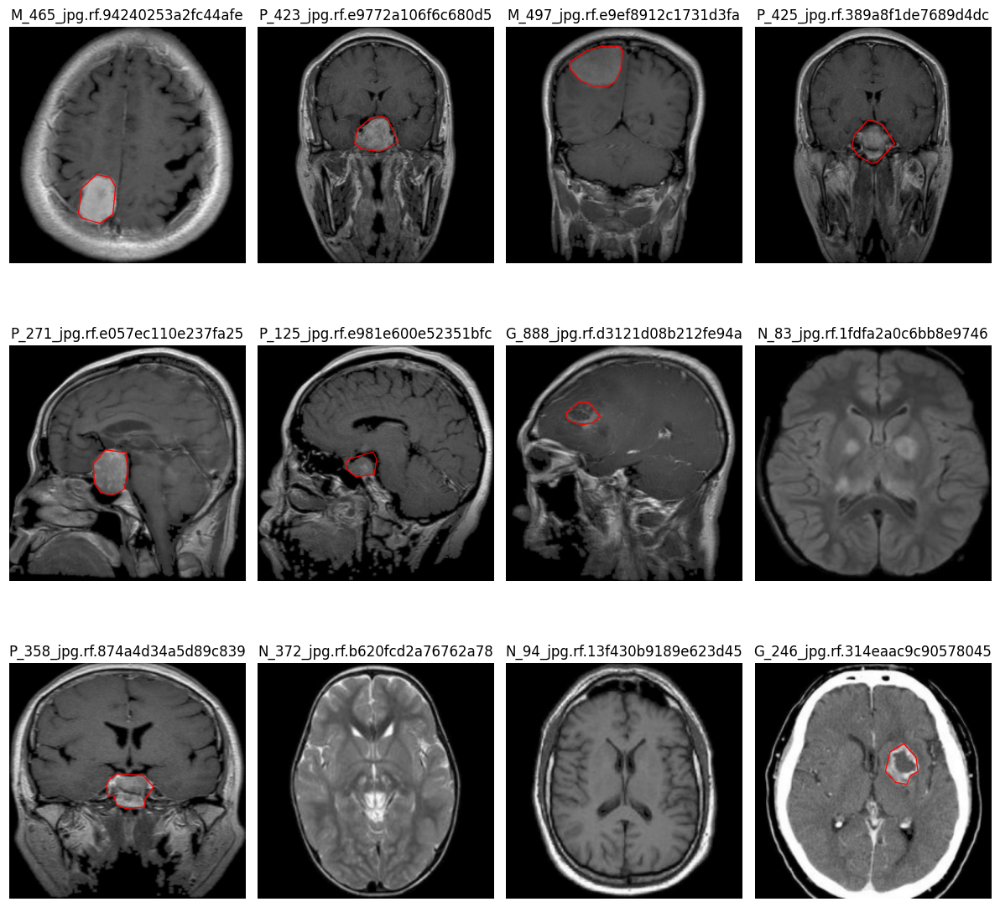

In [13]:
# Define directories
image_dir = "/kaggle/input/brain-tumor-segmentation/train/images/"
label_dir = "/kaggle/input/brain-tumor-segmentation/train/labels/"

# 🔹 Step 1: Get a List of Image Files
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
random.shuffle(image_files)  # Shuffle to pick random images

# Select 9 images (or fewer if not enough exist)
num_images = min(12, len(image_files))
selected_images = image_files[:num_images]

# 🔹 Step 2: Create Subplots
fig, axes = plt.subplots(3, 4, figsize=(12, 12))
axes = axes.flatten()  # Flatten 3x3 array into a list

# 🔹 Step 3: Process Each Image
for idx, image_name in enumerate(selected_images):
    image_path = os.path.join(image_dir, image_name)
    
    # Load Image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Find Corresponding Label File
    base_name = os.path.splitext(image_name)[0]
    label_name = f"{base_name}.txt"
    label_path = os.path.join(label_dir, label_name)

    # Read Label File & Extract Polygon Coordinates
    polygon_coords = []
    if os.path.exists(label_path):
        with open(label_path, "r") as file:
            for line in file:
                values = list(map(float, line.strip().split()))
                
                if len(values) < 3:  # Must contain at least class ID + 2 coordinates
                    continue
                
                class_id = int(values[0])  # Ignore class ID
                coords = values[1:]

                if len(coords) % 2 != 0:  # Ensure even number of coordinates
                    continue

                coords = np.array(coords, dtype=np.float32).reshape((-1, 2))
                coords[:, 0] *= image.shape[1]  # Convert normalized X to pixel value
                coords[:, 1] *= image.shape[0]  # Convert normalized Y to pixel value
                coords = coords.astype(np.int32)

                polygon_coords.append(coords)

    # Draw Polygons
    for polygon in polygon_coords:
        cv2.polylines(image, [polygon], isClosed=True, color=(255, 0, 0), thickness=2)

    # Show in subplot
    axes[idx].imshow(image)
    axes[idx].axis("off")
    axes[idx].set_title(image_name[:30])  # Show part of filename as title

# 🔹 Hide Unused Subplots (if less than 9 images)
for i in range(num_images, 9):
    axes[i].axis("off")

plt.tight_layout()
plt.show()


 <p style="color:navy;font-family:newtimeroman;font-size:250%;text-align:center; font-weight:8000"> 🟡 Count plot of classes 🟡 </p>

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


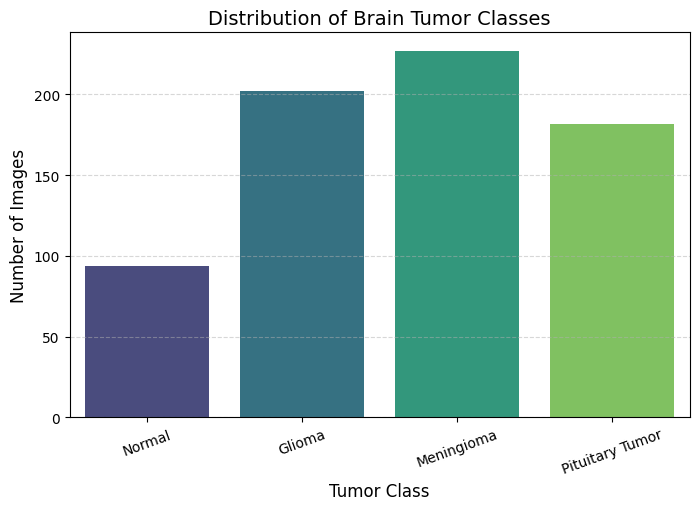

In [16]:
# 📂 Define Image Directory
image_dir = "/kaggle/input/brain-tumor-object-detection-segmentation/train/images"

# 🏷️ Class Mapping Based on First Letter
class_labels = {
    "M": "Meningioma",
    "P": "Pituitary Tumor",
    "G": "Glioma",
    "N": "Normal"
}

# 🖼️ Get Class Counts from Image Filenames
class_counts = Counter()

for filename in os.listdir(image_dir):
    if filename.endswith(('.jpg', '.png', '.jpeg')):  # Check if it's an image file
        class_letter = filename[0]  # First character of filename
        if class_letter in class_labels:  # Only count valid class letters
            class_counts[class_labels[class_letter]] += 1

# 🎨 Plot the Class Distribution
plt.figure(figsize=(8, 5))
sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette="viridis")

# 🏷️ Labels & Title
plt.xlabel("Tumor Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Distribution of Brain Tumor Classes", fontsize=14)
plt.grid(axis='y', linestyle="--", alpha=0.5)  # Add a subtle grid

# 📊 Show the Plot
plt.show()


# <p style="padding:20px;background-color:black;margin:0;color:yellow;font-family:newtimeroman;font-size:120%;text-align:center;border-radius: 15px 500px;overflow:hidden;font-weight:800">♻ Step 4  | Preprocess </p>

 <p style="color:navy;font-family:newtimeroman;font-size:200%;text-align:left; font-weight:8000"> 👉 First lets Relocate our data into kaggle/working for forward preprocessing,because we cant change our data in INPUT section. </p>

In [18]:
# Define dataset paths
base_input_path = "/kaggle/input/brain-tumor-object-detection-segmentation"  # Change this to your dataset
base_working_path = "/kaggle/working/brain-tumor-object-detection_yolo11"  # New writable location

# Copy dataset to working directory (only if not already copied)
if not os.path.exists(base_working_path):
    shutil.copytree(base_input_path, base_working_path)
    print("✅ Dataset copied to /kaggle/working/")

✅ Dataset copied to /kaggle/working/


 <p style="color:navy;font-family:newtimeroman;font-size:200%;text-align:left; font-weight:8000"> 📽 Create YAML file. </p>

In [28]:
# Define the dataset_path
dataset_path_yolo_object_detection = '/kaggle/working/brain-tumor-object-detection_yolo11/data.yaml'

# Set the path to the YAML file
yaml_file_path_yolo_object_detection = os.path.join(dataset_path_yolo_object_detection)

# Load and print the contents of the YAML file
with open(dataset_path_yolo_object_detection, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- glioma_tumor
- meningioma_tumor
- pituitary_tumor
nc: 3
roboflow:
  license: CC BY 4.0
  project: brain-mri-s06nn
  url: https://universe.roboflow.com/brain-mri-egxd0/brain-mri-s06nn/dataset/5
  version: 5
  workspace: brain-mri-egxd0
test: ../test/images
train: ../train/images
val: ../valid/images



 <p style="color:navy;font-family:newtimeroman;font-size:200%;text-align:left; font-weight:8000"> 👓 Count and resolution of Images. </p>

In [24]:
# Set paths for training and validation image sets
train_images_path = os.path.join(base_working_path, 'train', 'images')
valid_images_path = os.path.join(base_working_path, 'valid', 'images')

# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()

# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):  
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'): 
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

Number of training images: 705
Number of validation images: 133
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


# <p style="padding:20px;background-color:black;margin:0;color:yellow;font-family:newtimeroman;font-size:120%;text-align:center;border-radius: 15px 500px;overflow:hidden;font-weight:800">🌕 Step 5  | YOLO11.Object_detection</p>

 <p style="color:navy;font-family:newtimeroman;font-size:180%;text-align:left; font-weight:8000"> ✔ Image is from ultralytics.com<br>
 🔴if you didint get good results with |yolo11n.pt| you can try heavier and deeper models </p>

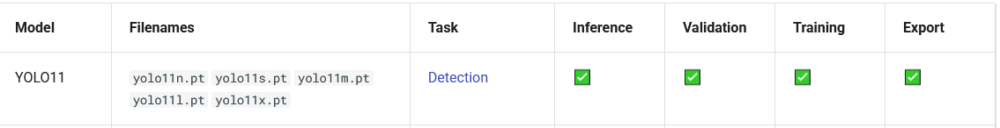

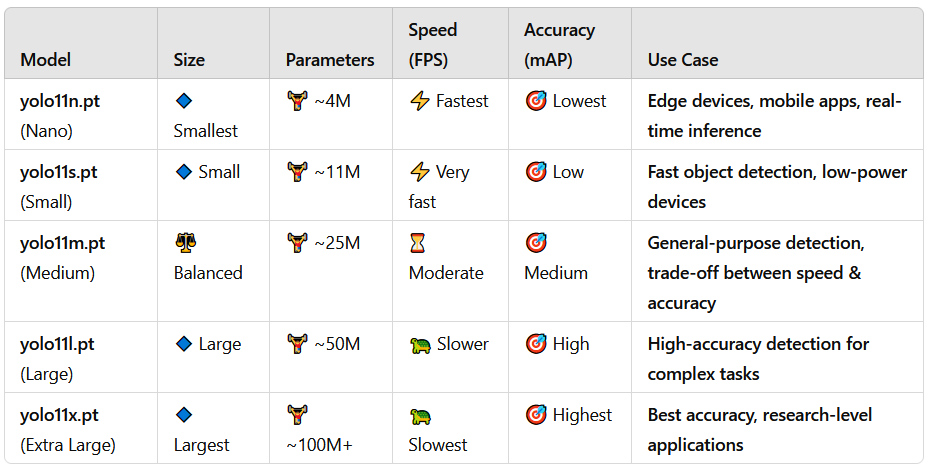

In [26]:
model_yolo_detection = YOLO("yolo11n.pt")

In [29]:
# Train the model on our custom dataset
results_yolo_detection = model_yolo_detection.train(
    data=yaml_file_path_yolo_object_detection,     # Path to the dataset configuration file
    epochs=150,              # Number of epochs to train for
    imgsz=640,               # Size of input images as integer
    device=0,                # Device to run on, i.e. cuda device=0 
    patience=150,             # Epochs to wait for no observable improvement for early stopping of training
    batch=32,                # Number of images per batch
    optimizer='auto',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    lr0=0.001,              # Initial learning rate 
    lrf=0.1,                 # Final learning rate (lr0 * lrf)
    dropout=0.3,             # Automatically restore best model# Use dropout regularization
    seed=0                   # Random seed for reproducibility
)

Ultralytics 8.3.75 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/kaggle/working/brain-tumor-object-detection_yolo11/data.yaml, epochs=150, time=None, patience=150, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.3, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_label

100%|██████████| 755k/755k [00:00<00:00, 16.7MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /kaggle/working/brain-tumor-object-detection_yolo11/train/labels... 705 images, 94 backgrounds, 0 corrupt: 100%|██████████| 705/705 [00:00<00:00, 1106.28it/s]

train: New cache created: /kaggle/working/brain-tumor-object-detection_yolo11/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 13, len(boxes) = 639. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.4 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/brain-tumor-object-detection_yolo11/valid/labels... 133 images, 25 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<00:00, 1046.37it/s]

val: New cache created: /kaggle/working/brain-tumor-object-detection_yolo11/valid/labels.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train2
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      4.76G      1.469      4.368       1.44          4        640: 100%|██████████| 23/23 [00:08<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.23it/s]

                   all        133        118    0.00269      0.603      0.159      0.088



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      4.69G      1.356      3.103      1.299          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.05it/s]

                   all        133        118    0.00207      0.674      0.211      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      4.69G      1.346      2.634      1.324          1        640: 100%|██████████| 23/23 [00:06<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]

                   all        133        118      0.322      0.144     0.0637     0.0314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150      4.69G      1.384      2.296      1.353          3        640: 100%|██████████| 23/23 [00:06<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all        133        118      0.607      0.342      0.381      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      4.69G      1.409       2.11      1.386          2        640: 100%|██████████| 23/23 [00:06<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.34it/s]

                   all        133        118      0.677      0.576      0.685      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      4.69G      1.362      2.214      1.341          0        640: 100%|██████████| 23/23 [00:06<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.84it/s]

                   all        133        118      0.645      0.496       0.49      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      4.69G      1.362        1.8      1.364          1        640: 100%|██████████| 23/23 [00:06<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all        133        118      0.502      0.272      0.296      0.167



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      4.69G      1.352      1.608      1.323          4        640: 100%|██████████| 23/23 [00:06<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.51it/s]

                   all        133        118       0.64      0.518      0.584      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      4.68G      1.232      1.481       1.23          0        640: 100%|██████████| 23/23 [00:06<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all        133        118       0.75      0.662      0.699      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      4.69G      1.328      1.437      1.318          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.49it/s]

                   all        133        118      0.595      0.697      0.681      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      4.68G      1.252      1.422      1.241          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all        133        118      0.718      0.626       0.73      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      4.69G      1.248      1.247      1.297          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all        133        118      0.599      0.685      0.629      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      4.68G      1.247      1.205      1.267          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all        133        118      0.691      0.666      0.769      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150      4.69G      1.321      1.174      1.314          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all        133        118      0.812      0.627      0.743      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150      4.68G       1.24      1.133      1.297          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.50it/s]

                   all        133        118      0.796      0.766      0.853      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      4.69G      1.265       1.08      1.289          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all        133        118      0.637      0.743      0.736      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      4.68G      1.245      1.055      1.265          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.63it/s]

                   all        133        118      0.798       0.76      0.837      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      4.69G      1.211      1.022      1.237          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.52it/s]

                   all        133        118      0.811      0.749      0.858      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      4.68G      1.185     0.9301      1.227          5        640: 100%|██████████| 23/23 [00:07<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all        133        118      0.809      0.747      0.817      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      4.69G      1.201     0.9702      1.223          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.57it/s]

                   all        133        118      0.863      0.829      0.913      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      4.68G       1.12      1.058       1.18          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all        133        118       0.87      0.713      0.846      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      4.69G      1.226     0.9621      1.237          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.71it/s]

                   all        133        118      0.926      0.779      0.885      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      4.68G      1.157     0.8769      1.229          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]

                   all        133        118      0.876      0.815      0.915       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      4.69G      1.177     0.8964      1.218          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all        133        118      0.857       0.82      0.892      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      4.68G      1.184     0.8994      1.216          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.54it/s]

                   all        133        118      0.873      0.748      0.871       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      4.69G       1.16     0.8838      1.195          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all        133        118      0.743      0.837       0.85      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      4.68G      1.139     0.8521      1.192          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.59it/s]

                   all        133        118      0.888      0.737      0.895      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      4.72G      1.162     0.8676      1.203          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.56it/s]

                   all        133        118      0.883      0.834      0.901      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      4.68G      1.149      0.929      1.176          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.64it/s]

                   all        133        118      0.846      0.884      0.907      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      4.69G      1.126     0.8444      1.171          5        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.63it/s]

                   all        133        118      0.826      0.793       0.89      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      4.68G      1.097     0.8385      1.183          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.63it/s]

                   all        133        118      0.876      0.889      0.929      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      4.69G      1.149     0.8423      1.196          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.70it/s]

                   all        133        118      0.857      0.882      0.921       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      4.68G      1.186     0.8824      1.214          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]

                   all        133        118      0.792      0.913      0.925      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      4.69G      1.108     0.8272      1.198          4        640: 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.57it/s]

                   all        133        118      0.848      0.876      0.914      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150      4.68G      1.123      0.808      1.181          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.54it/s]

                   all        133        118      0.825      0.827      0.868      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      4.69G      1.152     0.8991      1.203          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.58it/s]

                   all        133        118      0.864      0.771      0.862      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      4.68G      1.058     0.7952      1.152          4        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]

                   all        133        118      0.919      0.847       0.95      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      4.69G      1.183     0.8508       1.26          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.88it/s]

                   all        133        118      0.789      0.682      0.802      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150      4.68G      1.104     0.7641      1.181          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all        133        118      0.865      0.846      0.902      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      4.69G      1.007     0.8303      1.117          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all        133        118      0.878      0.887      0.914      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      4.68G      1.156     0.8046      1.184          4        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all        133        118      0.805      0.761      0.858       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      4.69G      1.019     0.7342      1.151          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all        133        118      0.801      0.801      0.857      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      4.68G      1.098     0.8393      1.186          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all        133        118      0.801      0.877      0.906      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      4.69G      1.089      0.786      1.185          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all        133        118      0.832      0.854      0.913       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      4.68G       1.19      0.783      1.181          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.60it/s]

                   all        133        118      0.856      0.886      0.906      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      4.69G      1.091     0.7096      1.181          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.45it/s]

                   all        133        118      0.795      0.901      0.894      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      4.68G      1.018     0.6718      1.114          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.74it/s]

                   all        133        118      0.908      0.837      0.926      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      4.69G     0.9801      0.726      1.088          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.94it/s]

                   all        133        118      0.853      0.871      0.908      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      4.68G      1.062     0.6826      1.155          5        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]

                   all        133        118      0.869      0.865      0.913      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      4.69G      1.012     0.6508      1.104          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.58it/s]

                   all        133        118      0.839      0.823      0.892      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      4.68G     0.9741     0.7443      1.083          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.70it/s]

                   all        133        118      0.831      0.897       0.93      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      4.69G     0.9519     0.6544      1.076          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.65it/s]

                   all        133        118      0.909       0.84      0.934      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      4.68G      1.015     0.6759      1.123          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.18it/s]

                   all        133        118      0.917      0.875      0.921      0.646



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150      4.69G      1.035     0.6887      1.187          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.64it/s]

                   all        133        118      0.924      0.827      0.927      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      4.71G     0.9919      0.655       1.08          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.61it/s]

                   all        133        118      0.903      0.875      0.941       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      4.69G       1.04     0.6705      1.137          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all        133        118      0.853      0.848      0.913      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      4.68G     0.9945     0.6445      1.121          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.89it/s]

                   all        133        118      0.873      0.858      0.918      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      4.69G       1.02     0.6753      1.135          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]

                   all        133        118      0.916      0.821      0.885      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      4.68G     0.9869     0.6391        1.1          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]

                   all        133        118      0.887      0.904      0.934      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      4.69G     0.9668     0.7097      1.115          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all        133        118      0.729      0.802      0.866      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      4.68G      1.011     0.6238      1.113          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]

                   all        133        118      0.935       0.85      0.929      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      4.69G      1.013      0.668      1.122          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all        133        118       0.93      0.844      0.931      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      4.68G     0.9582     0.6155      1.093          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.89it/s]

                   all        133        118      0.921      0.822      0.906       0.61



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      4.69G     0.9993     0.6073      1.131          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all        133        118      0.872       0.83      0.876      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      4.68G     0.9887     0.5955      1.106          4        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all        133        118      0.956      0.848      0.922      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      4.69G     0.9549     0.6258      1.106          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.59it/s]

                   all        133        118      0.905      0.902      0.933      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      4.68G     0.9428     0.5766      1.084          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all        133        118      0.959      0.892      0.939      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      4.69G     0.9767     0.6111       1.13          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.57it/s]

                   all        133        118      0.907      0.848      0.923      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      4.68G     0.9119     0.5876       1.08          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.72it/s]

                   all        133        118      0.897       0.88      0.918      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      4.69G     0.9273     0.5981      1.091          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.71it/s]

                   all        133        118      0.938      0.846       0.93       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150      4.68G     0.8899     0.5804      1.028          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.45it/s]

                   all        133        118      0.949       0.86      0.955       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      4.69G     0.9461     0.6003      1.083          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all        133        118      0.903      0.883      0.931      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      4.68G     0.8932     0.5412      1.057          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.67it/s]

                   all        133        118      0.943       0.84      0.924      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      4.69G       0.94     0.6015      1.071          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.58it/s]

                   all        133        118      0.864      0.812      0.872      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150      4.68G     0.9026     0.5606      1.081          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.91it/s]

                   all        133        118      0.877      0.914      0.934      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      4.69G     0.9187     0.5828      1.067          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.84it/s]

                   all        133        118      0.921      0.865      0.925      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      4.68G     0.9061     0.5559      1.051          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.77it/s]

                   all        133        118      0.875      0.892      0.915      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      4.69G     0.9072     0.5934      1.078          5        640: 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.30it/s]

                   all        133        118      0.916      0.869      0.933      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      4.68G     0.8602     0.5484      1.021          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all        133        118      0.853      0.837      0.875       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      4.69G      0.909     0.6981      1.066          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all        133        118      0.935      0.903      0.941      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      4.68G     0.9139     0.5729      1.082          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.92it/s]

                   all        133        118      0.929      0.852      0.916      0.644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      4.69G      0.825       0.54      1.037          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.71it/s]

                   all        133        118      0.878      0.918      0.939      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150      4.68G     0.8971     0.5296      1.063          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.85it/s]

                   all        133        118      0.918      0.901      0.945      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      4.69G     0.8567     0.7279      1.026          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.58it/s]

                   all        133        118      0.936      0.897      0.937      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      4.68G     0.8453     0.5148      1.032          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.66it/s]

                   all        133        118      0.928      0.893      0.941      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150      4.69G      0.908     0.5773      1.062          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.71it/s]

                   all        133        118      0.917      0.877       0.93       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150      4.68G     0.9149     0.5408      1.083          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all        133        118      0.916      0.931      0.947      0.651



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      4.69G     0.8731     0.5348       1.06          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.94it/s]

                   all        133        118      0.924       0.86      0.937      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      4.68G      0.836     0.5164      1.006          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all        133        118      0.943      0.803        0.9      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      4.69G     0.8336     0.5135      1.001          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]

                   all        133        118      0.953      0.881      0.948      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150      4.68G     0.8075     0.5087      1.003          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.81it/s]

                   all        133        118      0.916      0.875      0.948      0.654



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150      4.69G     0.8521     0.5069      1.041          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.92it/s]

                   all        133        118      0.896      0.928      0.956      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150      4.68G     0.8356     0.5087       1.04          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]

                   all        133        118      0.942      0.906      0.956      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      4.69G     0.8703     0.5267      1.043          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]

                   all        133        118      0.908      0.925      0.952       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      4.68G     0.7859      0.489      1.013          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all        133        118       0.93      0.906       0.95      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      4.69G     0.8204     0.5009      1.045          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.36it/s]

                   all        133        118       0.89      0.908      0.929      0.649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150      4.68G     0.8059     0.6377      1.012          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.91it/s]

                   all        133        118      0.878      0.925      0.945      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150      4.69G     0.8267     0.5255      1.044          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.69it/s]

                   all        133        118      0.909      0.911      0.947      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      4.71G     0.8379     0.5229      1.031          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.98it/s]

                   all        133        118      0.948       0.91      0.933      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      4.69G     0.7716     0.4796     0.9636          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.76it/s]

                   all        133        118      0.907      0.901      0.939      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      4.68G     0.8257     0.5524      1.034          4        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.87it/s]

                   all        133        118      0.945      0.916      0.942      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      4.69G     0.7542     0.4578     0.9713          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.88it/s]

                   all        133        118      0.934      0.938      0.964      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150      4.68G     0.8009      0.468      1.023          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.58it/s]

                   all        133        118       0.93      0.974      0.976      0.687



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150      4.69G     0.7702     0.4717      1.011          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all        133        118        0.9      0.845      0.902      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      4.68G     0.7996     0.5415      1.045          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]

                   all        133        118      0.909      0.892      0.946      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150      4.69G     0.7596     0.5213     0.9685          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]

                   all        133        118      0.924      0.912      0.945      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150      4.68G      0.774     0.4633      1.013          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.93it/s]

                   all        133        118      0.893      0.899      0.943      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      4.69G     0.7389     0.4522      1.007          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.71it/s]

                   all        133        118      0.955      0.927      0.971      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      4.68G     0.7579     0.4415     0.9948          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all        133        118      0.904      0.942      0.961       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150      4.69G     0.8267     0.6232      1.057          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.99it/s]

                   all        133        118      0.927      0.918      0.952       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150      4.71G     0.7546     0.4514     0.9816          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.91it/s]

                   all        133        118      0.901      0.949      0.954      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      4.69G     0.7699     0.4627      1.005          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]

                   all        133        118      0.966      0.897      0.952      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      4.68G     0.7292     0.4382     0.9675          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.62it/s]

                   all        133        118      0.935      0.866       0.94      0.658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      4.69G     0.7877     0.4967      1.025          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]

                   all        133        118      0.896      0.954      0.961      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150      4.68G     0.8698     0.5177      1.164          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all        133        118      0.958      0.919      0.967      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      4.69G     0.7226     0.5057     0.9612          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.86it/s]

                   all        133        118      0.905      0.912      0.955      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      4.68G     0.7373      0.464     0.9959          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all        133        118      0.926       0.88      0.932      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      4.69G     0.7866     0.5163       1.04          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.68it/s]

                   all        133        118      0.946      0.897      0.943      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150      4.68G     0.7139     0.4388     0.9914          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.94it/s]

                   all        133        118      0.951      0.888      0.944      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150      4.69G     0.7917     0.4568      1.023          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]

                   all        133        118      0.935      0.885      0.942      0.645



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150      4.68G     0.7316     0.4162     0.9671          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.51it/s]

                   all        133        118       0.98      0.924      0.941      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      4.69G     0.7593     0.4402      1.003          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.92it/s]

                   all        133        118      0.927        0.9      0.923      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150      4.71G      0.695     0.5082     0.9525          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all        133        118      0.935      0.926      0.948      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150      4.69G     0.6859     0.4678     0.9513          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.91it/s]

                   all        133        118       0.95      0.899      0.948      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150      4.68G     0.7682     0.5229      1.018          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.75it/s]

                   all        133        118      0.927      0.903      0.942      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150      4.69G     0.7159     0.4255      1.009          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]

                   all        133        118      0.934      0.936      0.951      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150      4.68G     0.6902     0.4169     0.9462          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.90it/s]

                   all        133        118      0.953      0.912      0.952      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      4.69G     0.7056     0.4261     0.9714          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.64it/s]

                   all        133        118      0.935      0.912      0.948       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      4.68G     0.6634     0.4179     0.9425          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.87it/s]

                   all        133        118      0.916      0.935      0.947      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150      4.69G     0.7114     0.4272     0.9911          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all        133        118      0.948      0.908      0.953      0.667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150      4.68G     0.7234     0.4271     0.9862          4        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.88it/s]

                   all        133        118      0.925      0.927      0.952       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150      4.72G      0.759     0.4766     0.9916          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all        133        118      0.905      0.925      0.941      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      4.68G     0.6857     0.3993     0.9408          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.78it/s]

                   all        133        118      0.952      0.907      0.951      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150      4.69G     0.6893     0.3985     0.9813          2        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all        133        118       0.91      0.954      0.959      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150      4.68G     0.7019     0.4064     0.9692          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.79it/s]

                   all        133        118       0.93      0.935      0.953      0.669



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150      4.69G     0.6628     0.3984     0.9726          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.89it/s]

                   all        133        118      0.949      0.891      0.961      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150      4.68G     0.6704     0.4076     0.9711          3        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.96it/s]

                   all        133        118       0.96      0.899      0.954      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150      4.69G     0.7192     0.4056     0.9898          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.99it/s]

                   all        133        118      0.955      0.918      0.949      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150      4.68G     0.6965     0.4507     0.9747          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.27it/s]

                   all        133        118      0.947      0.914      0.955      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150      4.69G      0.625     0.4056      0.922          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.82it/s]

                   all        133        118      0.964      0.912      0.954      0.681


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150      4.68G     0.5989     0.3446     0.9353          1        640: 100%|██████████| 23/23 [00:09<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.83it/s]

                   all        133        118      0.951      0.898      0.943      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150      4.69G     0.5915     0.3238     0.9284          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.94it/s]

                   all        133        118      0.935      0.896      0.947      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150      4.68G     0.5783     0.3117     0.9357          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.87it/s]

                   all        133        118      0.936      0.927      0.947      0.668



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150      4.69G     0.5404     0.2969     0.9067          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.84it/s]

                   all        133        118      0.935      0.945      0.958      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150      4.68G     0.5381     0.2958      0.903          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.87it/s]

                   all        133        118      0.959      0.905      0.947      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150      4.69G     0.5385     0.2962     0.8847          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.23it/s]

                   all        133        118      0.962      0.928      0.949      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150      4.68G     0.5574     0.2974     0.9503          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.73it/s]

                   all        133        118      0.956      0.929      0.949      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150      4.69G     0.5315     0.3218     0.8986          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.80it/s]

                   all        133        118      0.915      0.942      0.952      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150      4.68G     0.5273     0.3434     0.8928          1        640: 100%|██████████| 23/23 [00:07<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  3.71it/s]

                   all        133        118      0.931      0.918      0.955      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/150      4.69G     0.4924     0.2754     0.8523          0        640: 100%|██████████| 23/23 [00:07<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.09it/s]

                   all        133        118      0.937      0.931      0.956       0.67



150 epochs completed in 0.376 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 5.5MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.75 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.69it/s]


                   all        133        118      0.932      0.972      0.976       0.69
          glioma_tumor         36         46       0.89      0.957       0.96      0.702
      meningioma_tumor         42         42      0.998      0.976      0.989      0.777
       pituitary_tumor         30         30      0.908      0.983      0.978      0.591


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 2.9ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/train2


# <p style="padding:20px;background-color:black;margin:0;color:yellow;font-family:newtimeroman;font-size:120%;text-align:center;border-radius: 15px 500px;overflow:hidden;font-weight:800">🔍 Step 5.1  | YOLO.METRICS Guide</p>

<p style="color:navy; font-family:newtimeroman; font-size:180%; text-align:left; font-weight:800;">
🎯 YOLO METRICS Guide
</p>

<table style="width:100%; border-collapse:separate; border-spacing:0 15px; font-family:newtimeroman; font-size:150%; color:black;">
  <tr>
    <td style="font-weight:bold; padding:10px;">🔵 box_loss (Bounding Box Loss)</td>
    <td style="padding:10px;">Measures how accurately the predicted bounding boxes match the ground truth boxes.
Uses IoU (Intersection over Union) to evaluate how much overlap there is between the predicted and actual boxes.
A lower value is better, meaning the model is learning to place bounding boxes more accurately</td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🔵 cls_loss (Classification Loss)</td>
    <td style="padding:10px;">Measures the error in classifying objects within bounding boxes.
If an object is a "Pituitary Tumor" but the model classifies it as "Glioma," the classification loss increases.
A lower value means the model is better at predicting the correct class)</td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🔵 dfl_loss (Distribution Focal Loss)</td>
    <td style="padding:10px;">
      Used in YOLO's new loss function for bounding box refinement.
Helps the model learn to adjust the boundaries of the predicted boxes for better accuracy.
A lower value indicates better refinement of box edges
    </td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🔵 InstancesE</td>
    <td style="padding:10px;">
    The number of detected objects during training or evaluation.
    A higher number means the model is detecting more objects.</td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🔵 mAP50 (Mean Average Precision at IoU=0.50)</td>
    <td style="padding:10px;">Measures how well the model detects objects with at least 50% overlap between predicted and ground truth boxes.It calculates the precision-recall curve for different confidence thresholds and takes the area under the curve.A higher value is better, meaning the model is detecting objects accurately</td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🔵 mAP50-95 (Mean Average Precision at IoU 0.50 to 0.95)</td>
    <td style="padding:10px;">More strict than mAP50 because it evaluates the model at multiple IoU thresholds (0.50, 0.55, ..., 0.95).
A lower mAP50-95 compared to mAP50 is normal because higher IoU thresholds require more precise box placement.
This metric is the best overall indicator of model accuracy.</td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🔵 Box(P) (Box Precision)</td>
    <td style="padding:10px;">
    Measures how precise the bounding boxes are.
    A higher precision means fewer false positives (wrong detections).
    A lower precision means the model detects objects that aren’t actually therey
    </td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🔵 Box(R) (Box Recall)</td>
    <td style="padding:10px;"> Measures how well the model detects all relevant objects.
    A higher recall means the model is detecting more real objects.
    A lower recall means the model is missing objects.</td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🔵 metrics/precision(B) (Precision for Box Predictions)</td>
    <td style="padding:10px;">This tells how precise the model's bounding box predictions areHigher is better, but extreme values may mean the model is too cautious.</td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🔵 metrics/recall(B) (Recall for Box Predictions)</td>
    <td style="padding:10px;">
      Tells how many real objects the model correctly detects.Higher is better, but very high recall can mean the model is too sensitive, detecting even non-objects.
    </td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🔵 metrics/mAP50(B) (Mean Average Precision at IoU=0.50 for Box Predictions)</td>
    <td style="padding:10px;">
      Measures how well the model detects objects with at least 50% overlap.
    </td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🔴 fitness Score</td>
    <td style="padding:10px;">A custom metric used in YOLO to rank models.
Formula:
fitness=(0.1×Precision)+(0.9×Recall)+(0.4×mAP50)+(0.6×mAP50−95)
fitness=(0.1×Precision)+(0.9×Recall)+(0.4×mAP50)+(0.6×mAP50−95)
Higher is better, indicating a well-balanced model.
0.580 means the model is fairly good but can be improved.</td>
  </tr>
</table>


In [30]:
# Define the path to the directory
post_training_files_path_yolo_detect = '/kaggle/working/runs/detect/train2'

# List the files in the directory
!ls {post_training_files_path_yolo_detect}

args.yaml					  train_batch1.jpg
confusion_matrix_normalized.png			  train_batch2.jpg
confusion_matrix.png				  train_batch3220.jpg
events.out.tfevents.1739780544.3c4e333aa633.31.0  train_batch3221.jpg
F1_curve.png					  train_batch3222.jpg
labels_correlogram.jpg				  val_batch0_labels.jpg
labels.jpg					  val_batch0_pred.jpg
P_curve.png					  val_batch1_labels.jpg
PR_curve.png					  val_batch1_pred.jpg
R_curve.png					  val_batch2_labels.jpg
results.csv					  val_batch2_pred.jpg
results.png					  weights
train_batch0.jpg


In [31]:
# Define a function to plot learning curves for loss values
def plot_learning_curve(df_yolo_detect, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df_yolo_detect, x='epoch', y=train_loss_col, label='Train Loss', color='navy', linestyle='-', linewidth=2)
    sns.lineplot(data=df_yolo_detect, x='epoch', y=val_loss_col, label='Validation Loss', color='orange', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

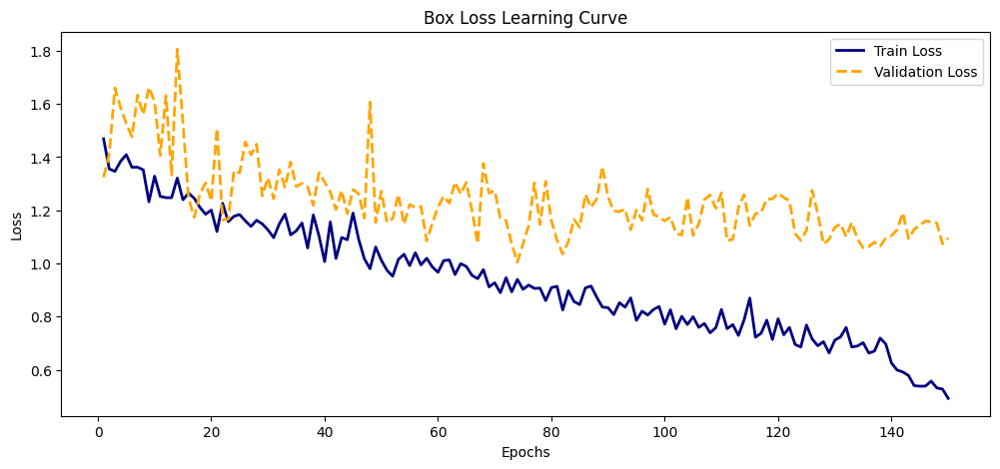

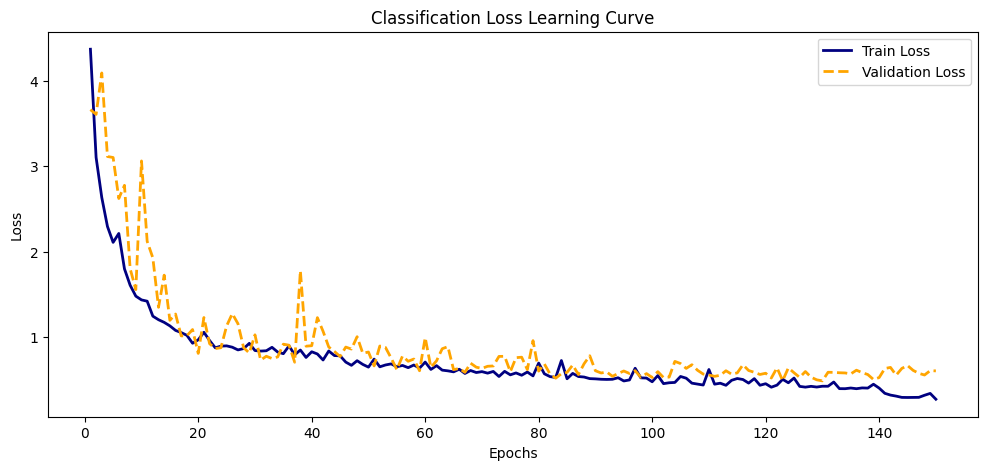

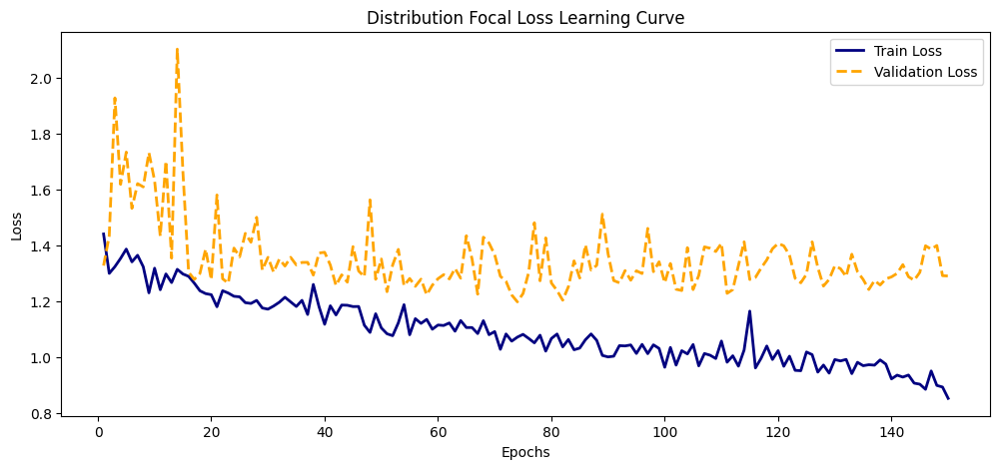

In [32]:
# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path = os.path.join(post_training_files_path_yolo_detect, 'results.csv')

# Load the CSV file from the constructed path into a pandas DataFrame
df_yolo_detect = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df_yolo_detect.columns = df_yolo_detect.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df_yolo_detect, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df_yolo_detect, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df_yolo_detect, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')

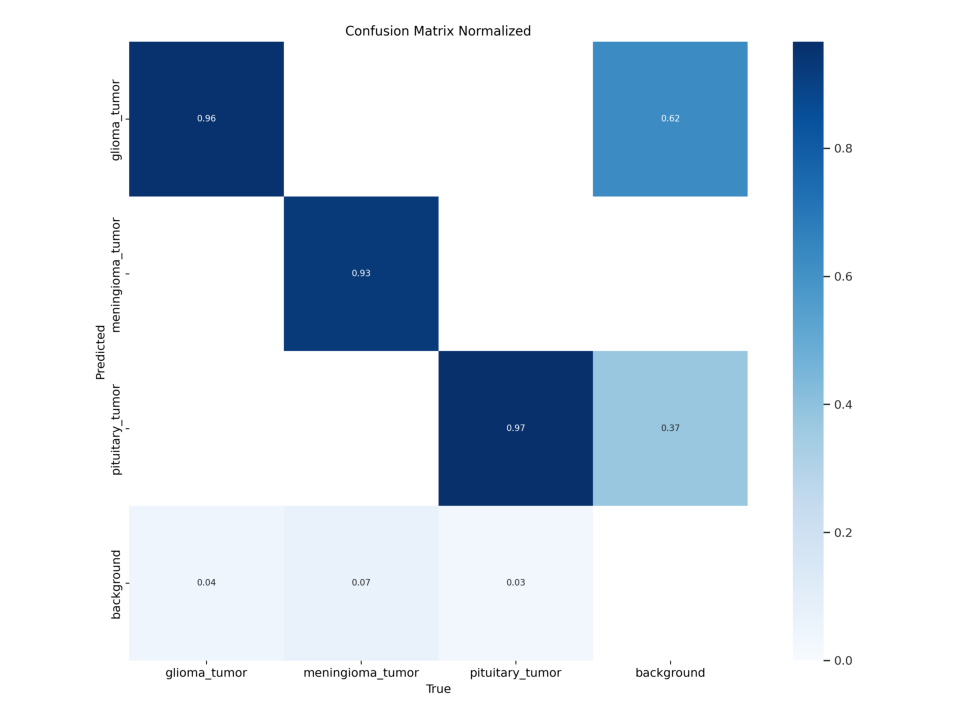

In [33]:
# Construct the path to the normalized confusion matrix image
confusion_matrix_path = os.path.join(post_training_files_path_yolo_detect, 'confusion_matrix_normalized.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off') 
plt.show()


In [35]:
# Construct the path to the best model weights file using os.path.join
best_model_path_yolo_detect = os.path.join(post_training_files_path_yolo_detect, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model_yolo_detect = YOLO(best_model_path_yolo_detect)

# Validate the best model using the validation set with default parameters
metrics_yolo_detect = best_model_yolo_detect.val(split='val')

Ultralytics 8.3.75 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 238 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /kaggle/working/brain-tumor-object-detection_yolo11/valid/labels.cache... 133 images, 25 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.75it/s]


                   all        133        118       0.93      0.974      0.976       0.69
          glioma_tumor         36         46      0.886      0.957       0.96      0.701
      meningioma_tumor         42         42      0.995      0.976      0.989      0.782
       pituitary_tumor         30         30      0.908      0.988      0.978      0.588


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 2.9ms preprocess, 4.9ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs/detect/val2


In [36]:
# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df_yolo_detect = pd.DataFrame.from_dict(metrics_yolo_detect.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df_yolo_detect.round(3)

,Metric Value
metrics/precision(B),0.930
metrics/recall(B),0.974
metrics/mAP50(B),0.976
metrics/mAP50-95(B),0.690
fitness,0.719


 <p style="color:black;font-family:newtimeroman;font-size:200%;text-align:center; font-weight:8000"> 📽 Ploting boundary Boxes 📽 </p>


image 1/1 /kaggle/working/brain-tumor-object-detection_yolo11/test/images/G_487_jpg.rf.cdae90e5e6d2bedb1771b9c6e9d08f41.jpg: 640x640 1 glioma_tumor, 13.4ms
Speed: 1.9ms preprocess, 13.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/brain-tumor-object-detection_yolo11/test/images/G_457_jpg.rf.42c0946c77aba643f86881b8277833bf.jpg: 640x640 2 glioma_tumors, 12.4ms
Speed: 1.7ms preprocess, 12.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/brain-tumor-object-detection_yolo11/test/images/G_347_jpg.rf.e305513d0b2a0841c0b65553836fb39a.jpg: 640x640 1 glioma_tumor, 8.5ms
Speed: 1.4ms preprocess, 8.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/brain-tumor-object-detection_yolo11/test/images/M_569_jpg.rf.b292ff67a588eb503a4ee48c05997cd6.jpg: 640x640 1 meningioma_tumor, 8.7ms
Speed: 1.4ms preprocess, 8.7ms inference, 1.1ms postprocess per image at shape 

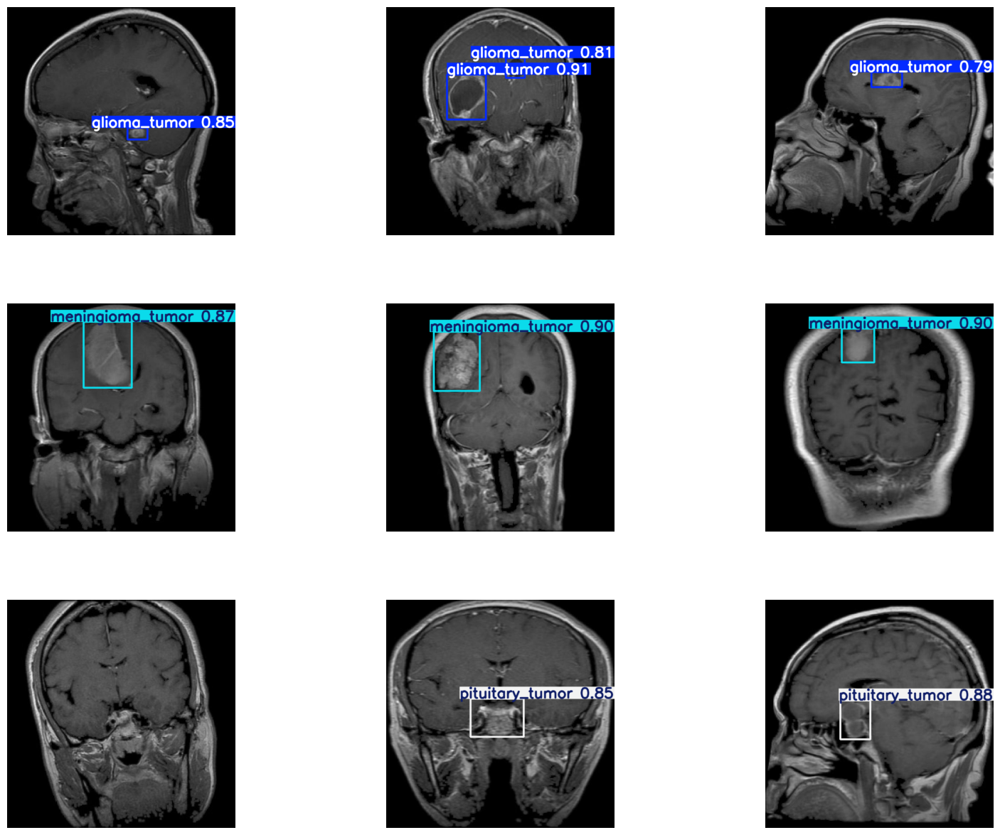

In [51]:
# Path to the test image folder
test_images_path = "/kaggle/working/brain-tumor-object-detection_yolo11/test/images"

# Define class mapping based on the first capital letter in filenames
class_mapping = {
    "G": "Glioma Tumor",
    "M": "Meningioma Tumor",
    "P": "Pituitary Tumor",
    "N": "Normal"
}

# Collect images by class
image_classes = {cls: [] for cls in class_mapping.keys()}

# Iterate through images and categorize them
for img_name in os.listdir(test_images_path):
    if img_name.endswith(('.jpg', '.png', '.jpeg')):
        class_letter = img_name[0]  # First capital letter
        if class_letter in image_classes:
            image_classes[class_letter].append(img_name)

# Select up to 9 images (3 per row, 3 rows)
selected_images = []
for class_letter, img_list in image_classes.items():
    selected_images.extend([(class_letter, img) for img in img_list[:3]])

# 🔹 Ensure exactly 9 images (duplicate if fewer)
while len(selected_images) < 9:
    selected_images.append(selected_images[len(selected_images) % len(selected_images)])

# Set up figure with 3x3 grid and larger size
fig, axes = plt.subplots(3, 3, figsize=(20, 15))  # Increased figure size

# Flatten axes for easy iteration
axes = axes.flatten()

# Loop through selected images and display them
for idx, (class_letter, img_name) in enumerate(selected_images[:9]):  # 🔹 Only take 9 images
    img_path = os.path.join(test_images_path, img_name)

    # Perform inference
    results = best_model_yolo_detect.predict(source=img_path, imgsz=640, conf=0.7) 
    
    # Get the annotated image with thicker boxes
    annotated_img = results[0].plot(line_width=4)  # Increased line width for visibility

    # Convert BGR to RGB
    annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)

    # Display image
    axes[idx].imshow(annotated_img)
    axes[idx].axis("off")

# Adjust layout for better spacing between images
plt.subplots_adjust(wspace=0.1, hspace=0.3)

plt.show()



image 1/1 /kaggle/working/brain-tumor-object-detection_yolo11/test/images/G_487_jpg.rf.cdae90e5e6d2bedb1771b9c6e9d08f41.jpg: 640x640 1 glioma_tumor, 11.2ms
Speed: 1.8ms preprocess, 11.2ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/brain-tumor-object-detection_yolo11/test/images/G_457_jpg.rf.42c0946c77aba643f86881b8277833bf.jpg: 640x640 2 glioma_tumors, 8.4ms
Speed: 1.4ms preprocess, 8.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/brain-tumor-object-detection_yolo11/test/images/G_347_jpg.rf.e305513d0b2a0841c0b65553836fb39a.jpg: 640x640 1 glioma_tumor, 8.0ms
Speed: 1.4ms preprocess, 8.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/brain-tumor-object-detection_yolo11/test/images/G_212_jpg.rf.41fcbeb300b71ef42247f4ecb247c908.jpg: 640x640 1 meningioma_tumor, 8.9ms
Speed: 1.4ms preprocess, 8.9ms inference, 1.2ms postprocess per image at shape (1

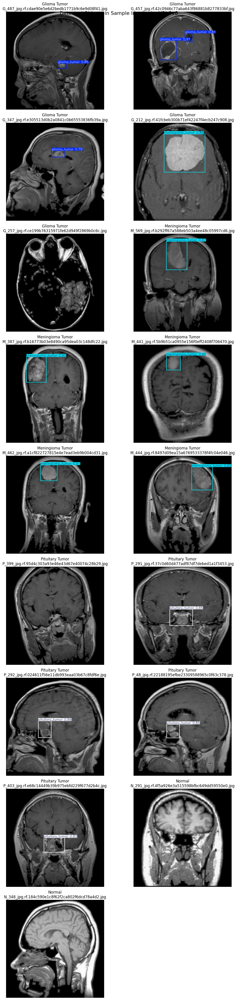

In [52]:
# Path to the test image folder
test_images_path = "/kaggle/working/brain-tumor-object-detection_yolo11/test/images"

# Define class mapping based on the first capital letter in filenames
class_mapping = {
    "G": "Glioma Tumor",
    "M": "Meningioma Tumor",
    "P": "Pituitary Tumor",
    "N": "Normal"
}

# Collect images by class
image_classes = {cls: [] for cls in class_mapping.keys()}

# Iterate through images and categorize them
for img_name in os.listdir(test_images_path):
    if img_name.endswith(('.jpg', '.png', '.jpeg')):
        class_letter = img_name[0]  # First capital letter
        if class_letter in image_classes:
            image_classes[class_letter].append(img_name)

# Select 5 images per class
selected_images = []
for class_letter, img_list in image_classes.items():
    selected_images.extend([(class_letter, img) for img in img_list[:5]])

# Set up figure with 2 vertical columns
num_images = len(selected_images)
num_rows = (num_images + 1) // 2  # Ensures even layout

fig, axes = plt.subplots(num_rows, 2, figsize=(12, 5 * num_rows))

# Flatten axes in case of an odd number of images
axes = axes.flatten() if num_images > 1 else [axes]

# Loop through selected images and display them
for idx, (class_letter, img_name) in enumerate(selected_images):
    img_path = os.path.join(test_images_path, img_name)

    # Perform inference
    results = best_model_yolo_detect.predict(source=img_path, imgsz=640, conf=0.7) 
    annotated_img = results[0].plot(line_width=2)

    # Convert BGR to RGB
    annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)

    # Display image
    axes[idx].imshow(annotated_img)
    axes[idx].set_title(f"{class_mapping[class_letter]}\n{img_name}", fontsize=12)
    axes[idx].axis("off")

# Remove extra subplots if images are not exactly even
for i in range(idx + 1, len(axes)):
    fig.delaxes(axes[i])

plt.suptitle("Detected Objects in Sample Images by YOLOv8", fontsize=16)
plt.tight_layout()
plt.show()


# <p style="padding:20px;background-color:black;margin:0;color:yellow;font-family:newtimeroman;font-size:120%;text-align:center;border-radius: 15px 500px;overflow:hidden;font-weight:800">🌕 Step 6  | YOLO11.Segmentation</p>

 <p style="color:navy;font-family:newtimeroman;font-size:200%;text-align:left; font-weight:8000"> 👉 First lets Relocate our data into kaggle/working for forward preprocessing,because we cant change our data in INPUT section. </p>

In [3]:
# Define dataset paths
base_input_path = "/kaggle/input/brain-tumor-segmentation"  # Change this to your dataset
base_working_path = "/kaggle/working/brain-tumor-Segmentation_yolo11"  # New writable location

# Copy dataset to working directory (only if not already copied)
if not os.path.exists(base_working_path):
    shutil.copytree(base_input_path, base_working_path)
    print("✅ Dataset copied to /kaggle/working/")

✅ Dataset copied to /kaggle/working/


 <p style="color:navy;font-family:newtimeroman;font-size:200%;text-align:left; font-weight:8000"> 📽 Create YAML file. </p>

In [4]:
# Define the dataset_path
dataset_path_yolo_segmetation = '/kaggle/working/brain-tumor-Segmentation_yolo11/data.yaml'

# Set the path to the YAML file
yaml_file_path_yolo_segmentation = os.path.join(dataset_path_yolo_segmetation)

# Load and print the contents of the YAML file
with open(dataset_path_yolo_segmetation, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- glioma_tumor
- meningioma_tumor
- pituitary_tumor
nc: 3
roboflow:
  license: CC BY 4.0
  project: brain-mri-s06nn
  url: https://universe.roboflow.com/brain-mri-egxd0/brain-mri-s06nn/dataset/6
  version: 6
  workspace: brain-mri-egxd0
test: ../test/images
train: ../train/images
val: ../valid/images



 <p style="color:navy;font-family:newtimeroman;font-size:200%;text-align:left; font-weight:8000"> 👓 Count and resolution of Images. </p>

In [5]:
# Set paths for training and validation image sets
train_images_path = os.path.join(base_working_path, 'train', 'images')
valid_images_path = os.path.join(base_working_path, 'valid', 'images')

# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()

# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):  
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'): 
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

Number of training images: 704
Number of validation images: 133
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


 <p style="padding:10px;background-color:white;margin:200;color:black;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 1500px 500px;overflow:hidden;font-weight:8000"> 🔴 in this part we search in data and find incorect format labels(for segmentations,labels should have at least 7 parametrs,if the number is below this,it means we have a wrong format and face error in Training) 🔴 </p>

In [6]:
# List of label directories to check
label_dirs = [
    "/kaggle/working/brain-tumor-Segmentation_yolo11/train/labels",  # Train labels folder
    "/kaggle/working/brain-tumor-Segmentation_yolo11/valid/labels",  # Validation labels folder
    "/kaggle/working/brain-tumor-Segmentation_yolo11/test/labels"   # Test labels folder
]

# Loop through each label directory
for label_dir in label_dirs:
    if not os.path.exists(label_dir):
        print(f"⚠️ Directory does not exist: {label_dir}")
        continue

    print(f"Processing labels in {label_dir}...")

    # Loop through each label file in the directory
    for label_file in os.listdir(label_dir):
        label_path = os.path.join(label_dir, label_file)

        # Skip non-text files (just in case)
        if not label_file.endswith(".txt"):
            continue

        # Open and read the label file
        with open(label_path, "r") as file:
            incorrect_format = False  # Flag to check if the file has incorrect format
            for line in file:
                values = line.strip().split()

                # Check if the label is not in the correct format
                if len(values) < 7:  # Class ID + at least 3 (x, y) pairs
                    print(f"⚠️ Incorrect format in {label_file}: {line.strip()}")
                    incorrect_format = True
                    break  # No need to check further lines

            # If incorrect format found, delete the label file
            if incorrect_format:
                os.remove(label_path)
                print(f"❌ Deleted {label_file} due to incorrect format")

print("✅ Finished checking and removing incorrect labels!")


Processing labels in /kaggle/working/brain-tumor-Segmentation_yolo11/train/labels...
⚠️ Incorrect format in P_407_jpg.rf.6598061f15a416a2ef0c45827f636f8d.txt: 2 0.5125 0.60546875 0.26015625 0.134375
❌ Deleted P_407_jpg.rf.6598061f15a416a2ef0c45827f636f8d.txt due to incorrect format
⚠️ Incorrect format in G_363_jpg.rf.33d7401ed93615cbb89719634f9eeae5.txt: 0 0.5234375 0.42421875 0.14921875 0.09921875
❌ Deleted G_363_jpg.rf.33d7401ed93615cbb89719634f9eeae5.txt due to incorrect format
Processing labels in /kaggle/working/brain-tumor-Segmentation_yolo11/valid/labels...
Processing labels in /kaggle/working/brain-tumor-Segmentation_yolo11/test/labels...
✅ Finished checking and removing incorrect labels!


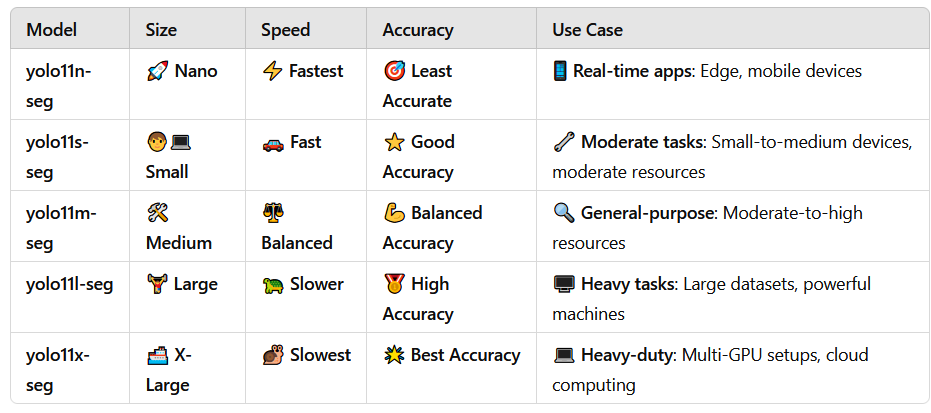

In [7]:
model_yolo_segmentation = YOLO("yolo11n-seg.pt")

100%|██████████| 5.90M/5.90M [00:00<00:00, 77.4MB/s]


In [8]:
# Train the model on our custom dataset
results_yolo_segmentation = model_yolo_segmentation.train(
    data=yaml_file_path_yolo_segmentation,     # Path to the dataset configuration file
    epochs=150,              # Number of epochs to train for
    imgsz=640,               # Size of input images as integer
    device=0,                # Device to run on, i.e. cuda device=0 
    patience=150,             # Epochs to wait for no observable improvement for early stopping of training
    batch=32,                # Number of images per batch
    optimizer='auto',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    lr0=0.001,              # Initial learning rate 
    lrf=0.1,                 # Final learning rate (lr0 * lrf)
    dropout=0.3,             # Automatically restore best model# Use dropout regularization
    seed=0                   # Random seed for reproducibility
)

Ultralytics 8.3.76 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=segment, mode=train, model=yolo11n-seg.pt, data=/kaggle/working/brain-tumor-Segmentation_yolo11/data.yaml, epochs=150, time=None, patience=150, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.3, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_label

100%|██████████| 755k/755k [00:00<00:00, 17.6MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 74.6MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/brain-tumor-Segmentation_yolo11/train/labels... 702 images, 99 backgrounds, 0 corrupt: 100%|██████████| 704/704 [00:00<00:00, 1045.35it/s]

train: New cache created: /kaggle/working/brain-tumor-Segmentation_yolo11/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.4 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/brain-tumor-Segmentation_yolo11/valid/labels... 133 images, 25 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<00:00, 977.13it/s]

val: New cache created: /kaggle/working/brain-tumor-Segmentation_yolo11/valid/labels.cache


Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.001' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/segment/train
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      1/150       5.4G      1.198      2.385      4.212      1.232         56        640: 100%|██████████| 22/22 [00:13<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.67it/s]


                   all        133        117    0.00381      0.815      0.301      0.196     0.0039       0.86      0.308      0.203

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      2/150      5.39G      1.155      1.752      3.052      1.149         45        640: 100%|██████████| 22/22 [00:10<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.99it/s]

                   all        133        117    0.00356      0.934      0.394      0.223    0.00349      0.935      0.392       0.23



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      3/150      5.47G      1.176      1.676      2.584      1.157         38        640: 100%|██████████| 22/22 [00:09<00:00,  2.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.07it/s]

                   all        133        117       0.91      0.122      0.486       0.31       0.91      0.122      0.495       0.29



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      4/150      5.45G      1.202      1.678      2.295      1.159         50        640: 100%|██████████| 22/22 [00:10<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.15it/s]

                   all        133        117      0.754      0.368      0.537      0.367      0.754      0.368      0.533      0.366



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      5/150       5.4G      1.157      1.686      2.089      1.143         56        640: 100%|██████████| 22/22 [00:10<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.15it/s]

                   all        133        117      0.763       0.34      0.441      0.277      0.755      0.333      0.438      0.262



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      6/150      5.45G      1.177      1.727       1.95      1.167         40        640: 100%|██████████| 22/22 [00:10<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.17it/s]

                   all        133        117      0.379      0.501      0.325      0.185      0.376      0.462      0.314      0.151



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      7/150      5.45G      1.165      1.629      1.752      1.187         40        640: 100%|██████████| 22/22 [00:10<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.00it/s]

                   all        133        117      0.586      0.484      0.586      0.418      0.586      0.495      0.613      0.412



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      8/150       5.4G      1.154      1.632      1.624      1.164         40        640: 100%|██████████| 22/22 [00:10<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.24it/s]

                   all        133        117      0.646      0.659       0.68       0.49      0.638      0.659      0.675       0.48



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      9/150      5.45G      1.117      1.649      1.428       1.14         48        640: 100%|██████████| 22/22 [00:10<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.26it/s]

                   all        133        117      0.704      0.535      0.574      0.367      0.704      0.535      0.562      0.357



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     10/150       5.4G       1.08      1.585      1.332      1.109         46        640: 100%|██████████| 22/22 [00:11<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all        133        117      0.712      0.442      0.585      0.412      0.468      0.667      0.604      0.402



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     11/150      5.45G      1.099      1.589      1.339      1.115         46        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.39it/s]

                   all        133        117       0.77      0.464      0.594       0.41      0.779      0.462      0.583      0.417



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     12/150      5.44G       1.11      1.537      1.233      1.115         42        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.33it/s]

                   all        133        117      0.715      0.753      0.793      0.581      0.728      0.756      0.797      0.563



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     13/150       5.4G       1.06      1.569      1.193      1.125         39        640: 100%|██████████| 22/22 [00:10<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all        133        117      0.704      0.697       0.76      0.538      0.797      0.664      0.765      0.526



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     14/150      5.39G      1.034      1.455      1.072      1.098         44        640: 100%|██████████| 22/22 [00:10<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.35it/s]

                   all        133        117       0.71      0.691      0.725      0.522      0.755      0.664      0.746      0.503



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     15/150      5.45G      1.032      1.493      1.104      1.112         60        640: 100%|██████████| 22/22 [00:10<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all        133        117      0.631      0.707       0.75      0.552      0.653      0.689      0.748      0.557



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     16/150      5.45G       1.02      1.503      1.074      1.108         40        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.37it/s]

                   all        133        117      0.674      0.764      0.799      0.596      0.681      0.787      0.815      0.596



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     17/150      5.45G      1.034      1.453      1.066      1.099         52        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]

                   all        133        117      0.866      0.755      0.836       0.63      0.873      0.756      0.844      0.621



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     18/150      5.44G     0.9867      1.413     0.9494      1.095         60        640: 100%|██████████| 22/22 [00:10<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.38it/s]

                   all        133        117      0.803      0.809      0.827      0.598      0.803      0.809      0.841      0.593



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     19/150       5.4G      1.015      1.424      1.002      1.094         54        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.38it/s]

                   all        133        117      0.765       0.72      0.786      0.591      0.707      0.778      0.784      0.576



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     20/150      5.39G      1.006      1.461     0.9541      1.088         44        640: 100%|██████████| 22/22 [00:10<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]

                   all        133        117       0.74      0.686      0.757      0.539       0.74      0.686      0.756      0.546



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     21/150       5.4G     0.9904      1.419     0.9634      1.085         46        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all        133        117      0.779      0.756      0.818      0.607       0.78      0.755      0.813      0.606



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     22/150      5.44G     0.9748      1.437     0.9397      1.065         44        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all        133        117      0.752      0.833      0.832      0.624       0.76      0.844      0.847      0.605



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     23/150      5.46G     0.9746      1.448     0.9248      1.073         42        640: 100%|██████████| 22/22 [00:10<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.39it/s]

                   all        133        117      0.861      0.812      0.882      0.632      0.853      0.805      0.873      0.621



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     24/150      5.39G     0.9597      1.414       0.88      1.046         70        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all        133        117      0.739      0.447       0.51      0.358      0.739      0.447      0.511      0.356



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     25/150       5.4G     0.9644      1.414     0.8697      1.066         44        640: 100%|██████████| 22/22 [00:10<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all        133        117      0.839      0.747      0.814      0.605      0.863      0.766      0.842      0.553



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     26/150      5.41G        0.9      1.276     0.8299      1.027         51        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.35it/s]

                   all        133        117      0.772      0.763      0.828      0.613      0.777      0.771      0.831      0.613



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     27/150      5.39G     0.9282      1.323     0.8342      1.054         49        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.43it/s]

                   all        133        117      0.859      0.736      0.828      0.585      0.859      0.736      0.829      0.593



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     28/150      5.39G     0.9295      1.382     0.8496      1.065         48        640: 100%|██████████| 22/22 [00:10<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]

                   all        133        117      0.757      0.685      0.831      0.623      0.768      0.692      0.842      0.601



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     29/150       5.4G     0.9558      1.347     0.8154      1.069         51        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.42it/s]

                   all        133        117      0.743       0.67      0.719      0.529      0.746      0.662      0.716      0.527



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     30/150      5.39G     0.9354       1.33     0.8248      1.058         51        640: 100%|██████████| 22/22 [00:10<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]

                   all        133        117      0.818      0.708      0.784      0.577      0.818      0.708      0.784      0.579



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     31/150      5.39G     0.9251      1.332     0.8537      1.047         40        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.50it/s]

                   all        133        117      0.792      0.816      0.867      0.654      0.786      0.811       0.86       0.64



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     32/150      5.45G     0.9003      1.319      0.768       1.04         47        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.41it/s]

                   all        133        117      0.711      0.799      0.808      0.607      0.711      0.799       0.83      0.603



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     33/150      5.44G     0.8791       1.26     0.7822      1.026         47        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.41it/s]

                   all        133        117      0.764      0.693      0.765      0.577      0.776      0.704      0.776      0.568



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     34/150      5.44G     0.9078      1.355     0.7863      1.032         49        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        133        117      0.813      0.812      0.861      0.643      0.821      0.842      0.895      0.634



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     35/150      5.39G     0.9032      1.359     0.7865      1.035         46        640: 100%|██████████| 22/22 [00:10<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]

                   all        133        117       0.79      0.769      0.844      0.664      0.815      0.787      0.881      0.641



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     36/150      5.39G     0.8623      1.219     0.7316      1.022         41        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]

                   all        133        117      0.849      0.868      0.901      0.661      0.846      0.865      0.892      0.659



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     37/150      5.29G     0.8838      1.228     0.7342      1.031         37        640: 100%|██████████| 22/22 [00:10<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]

                   all        133        117       0.72      0.832      0.867       0.64      0.702      0.822      0.839      0.607



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     38/150      5.45G     0.8541      1.254     0.7072      1.016         45        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        133        117      0.819      0.863      0.892       0.69      0.819      0.863      0.892       0.67



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     39/150      5.44G        0.9      1.303     0.7413      1.032         43        640: 100%|██████████| 22/22 [00:10<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all        133        117      0.832      0.813      0.858       0.63      0.836      0.812      0.858      0.636



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     40/150      5.45G     0.8639      1.259      0.733      1.023         56        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all        133        117      0.861      0.902      0.921      0.705      0.867      0.905      0.937       0.69



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     41/150      5.41G     0.8264      1.261     0.6576      1.009         50        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all        133        117      0.906      0.786      0.881      0.654      0.892      0.783      0.878       0.64



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     42/150      5.45G     0.8539       1.28      0.723      1.021         45        640: 100%|██████████| 22/22 [00:10<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        133        117      0.921      0.737      0.873      0.646      0.911      0.729      0.871      0.633



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     43/150      5.39G     0.8498      1.253     0.6958      1.021         37        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        133        117      0.838      0.867      0.917      0.708      0.858      0.886      0.933      0.701



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     44/150      5.39G     0.8364       1.23     0.6984      1.008         42        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        133        117      0.831      0.827      0.862      0.649      0.838      0.835      0.869      0.651



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     45/150      5.39G       0.88      1.313      0.704      1.011         49        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.17it/s]

                   all        133        117      0.826      0.893      0.902      0.674      0.826      0.893      0.902      0.673



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     46/150      5.31G     0.8237      1.236     0.6515      1.001         31        640: 100%|██████████| 22/22 [00:10<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117      0.825       0.81      0.848      0.644      0.841      0.826      0.887      0.648



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     47/150       5.4G     0.8152      1.173     0.6255     0.9891         46        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        133        117      0.822      0.865       0.91      0.706      0.814      0.857      0.904      0.689



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     48/150      5.44G     0.8134      1.236     0.6503     0.9877         58        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117      0.824      0.764      0.863      0.651      0.837      0.774       0.88      0.642



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     49/150      5.44G     0.7976      1.189     0.6501     0.9893         51        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117      0.857      0.878       0.92      0.692      0.857      0.878      0.917      0.685



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     50/150      5.44G     0.8213      1.233     0.6638      1.001         45        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.50it/s]

                   all        133        117      0.798      0.861      0.916      0.666      0.805      0.869      0.917      0.654



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     51/150       5.4G     0.8091      1.186     0.6076     0.9872         42        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        133        117       0.82      0.873      0.909      0.719       0.82      0.873      0.909      0.709



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     52/150      5.39G     0.8144      1.225     0.6181     0.9816         52        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all        133        117       0.86      0.737      0.865       0.67      0.813      0.784      0.873      0.654



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     53/150      5.45G     0.7993      1.175     0.6367     0.9924         62        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117       0.85      0.871      0.907      0.695      0.842      0.864      0.901      0.672



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     54/150      5.39G     0.8053      1.177     0.6046     0.9881         43        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.50it/s]

                   all        133        117      0.903      0.848      0.913      0.704      0.899      0.861      0.914       0.69



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     55/150      5.39G     0.8169      1.226     0.6067      1.003         42        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.50it/s]

                   all        133        117      0.898      0.869      0.937      0.725      0.898      0.869      0.926      0.711



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     56/150      5.44G     0.7983      1.198     0.6001     0.9852         42        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.46it/s]

                   all        133        117      0.743      0.887      0.879      0.676      0.748      0.895      0.881      0.653



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     57/150      5.44G     0.7879      1.158     0.6022     0.9735         49        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all        133        117      0.856      0.842      0.901      0.718      0.863       0.85      0.907      0.688



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     58/150      5.44G      0.798      1.186     0.6206     0.9794         46        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]

                   all        133        117       0.89      0.842      0.899      0.691      0.905      0.852      0.915      0.685



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     59/150      5.39G     0.7793      1.159     0.5953     0.9837         51        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        133        117      0.767       0.82      0.864      0.669      0.783       0.83      0.898      0.644



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     60/150      5.39G     0.7605      1.155     0.6022     0.9707         48        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        133        117       0.87      0.843      0.933      0.729       0.87      0.843      0.934      0.706



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     61/150      5.39G      0.755      1.144     0.5869     0.9777         46        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all        133        117      0.859      0.923       0.93      0.716      0.885      0.912      0.936      0.702



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     62/150      5.39G     0.7775      1.162     0.5837     0.9782         48        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        133        117      0.893      0.915      0.939      0.745      0.893      0.915      0.939      0.711



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     63/150      5.45G     0.7663      1.164     0.5882     0.9777         51        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        133        117      0.858      0.849      0.915      0.712      0.849      0.892      0.924      0.696



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     64/150       5.4G     0.7612      1.163     0.5672     0.9706         37        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.50it/s]

                   all        133        117      0.919      0.874      0.931      0.716      0.901      0.887      0.932      0.695



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     65/150      5.39G     0.7416      1.106      0.544     0.9496         51        640: 100%|██████████| 22/22 [00:10<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        133        117       0.86      0.913      0.948       0.72      0.852      0.901      0.935      0.696



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     66/150      5.45G      0.748      1.146     0.5658     0.9626         44        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117      0.898      0.867      0.939       0.74      0.884      0.865      0.934      0.715



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     67/150      5.39G      0.762      1.123     0.5752     0.9566         45        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]

                   all        133        117       0.89      0.877      0.935      0.729       0.89      0.877       0.94      0.719



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     68/150       5.4G     0.7509      1.157     0.5623     0.9672         43        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.25it/s]

                   all        133        117      0.844      0.858      0.908      0.703       0.85      0.866      0.911      0.685



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     69/150      5.41G     0.7432      1.112     0.5609     0.9671         48        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.45it/s]

                   all        133        117      0.943      0.807      0.932      0.734      0.957      0.818       0.94      0.716



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     70/150      5.39G     0.7289      1.127     0.5525     0.9474         43        640: 100%|██████████| 22/22 [00:10<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117      0.859      0.848      0.898      0.706      0.859      0.848      0.898      0.672



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     71/150      5.44G     0.7068      1.093     0.5332     0.9369         52        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all        133        117      0.892      0.865       0.94      0.711      0.905      0.876      0.944      0.696



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     72/150      5.39G     0.7243      1.102     0.5516      0.953         37        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        133        117      0.886      0.927      0.943      0.729      0.878      0.919      0.933       0.72



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     73/150      5.45G     0.7225      1.103      0.565     0.9533         41        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        133        117      0.878      0.916      0.945      0.731      0.878      0.916      0.947      0.725



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     74/150      5.39G     0.7252      1.096     0.5617     0.9567         53        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all        133        117      0.842      0.909      0.914      0.694      0.834      0.901      0.912       0.68



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     75/150      5.39G     0.7167      1.076     0.5397     0.9534         43        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        133        117      0.911      0.868      0.931      0.729      0.915      0.871      0.934      0.713



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     76/150      5.45G      0.697      1.038     0.5252     0.9343         46        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all        133        117      0.872      0.814      0.926      0.719      0.888      0.777      0.922      0.695



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     77/150      5.44G     0.7028      1.063     0.5152      0.956         48        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117      0.918      0.844      0.925      0.728      0.895      0.872      0.929       0.71



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     78/150      5.44G     0.7188      1.109     0.5331     0.9544         49        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        133        117      0.894      0.861      0.935        0.7      0.886      0.853      0.927      0.684



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     79/150      5.39G     0.7098      1.098     0.5192     0.9347         50        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        133        117      0.844      0.829      0.899      0.683       0.85      0.837      0.902      0.664



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     80/150      5.45G     0.6919      1.098     0.5113     0.9363         41        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all        133        117      0.897      0.907      0.944      0.736      0.903      0.914      0.951      0.706



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     81/150      5.39G      0.686      1.078     0.4933     0.9458         35        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all        133        117      0.888      0.835      0.921      0.729      0.887      0.836      0.923      0.705



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     82/150      5.39G     0.6716      1.033     0.4829     0.9373         44        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]

                   all        133        117      0.894      0.911      0.927       0.72      0.913       0.93      0.943      0.698



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     83/150      5.39G     0.7236      1.085       0.52     0.9529         50        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.50it/s]

                   all        133        117      0.889      0.905      0.955      0.764      0.905      0.915      0.958      0.738



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     84/150      5.39G     0.7022      1.061     0.5107     0.9432         47        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]

                   all        133        117      0.859      0.922      0.943      0.732      0.859      0.922      0.943      0.713



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     85/150      5.45G     0.6871       1.03     0.4981     0.9415         49        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all        133        117      0.923      0.908      0.956      0.728      0.919      0.914      0.958      0.723



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     86/150      5.44G     0.6645      1.026      0.484     0.9367         50        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        133        117       0.88      0.911       0.95      0.752      0.906      0.881      0.951       0.73



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     87/150       5.4G      0.696      1.084     0.5095     0.9497         49        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        133        117      0.922      0.913      0.955      0.738      0.914      0.904      0.945      0.719



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     88/150      5.44G     0.6938      1.053     0.4987     0.9433         36        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117      0.935      0.877      0.959      0.733      0.935      0.877      0.958      0.711



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     89/150      5.39G     0.7024       1.08     0.5238     0.9426         56        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all        133        117      0.889      0.942      0.943      0.734       0.89      0.942      0.941      0.713



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     90/150       5.4G     0.6584      1.042     0.4819     0.9309         47        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117      0.917      0.944      0.945      0.752      0.917      0.944      0.945      0.725



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     91/150       5.4G     0.6572      1.015     0.4606     0.9323         41        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.50it/s]

                   all        133        117       0.87      0.889      0.923      0.736      0.883      0.899      0.929      0.708



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     92/150      5.44G     0.6519      1.082     0.4959     0.9372         49        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        133        117      0.881      0.931      0.932      0.735      0.899       0.95      0.945      0.706



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     93/150       5.4G     0.6761      1.045     0.4944      0.938         44        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        133        117      0.903      0.931      0.951       0.75      0.914      0.943      0.958      0.736



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     94/150      5.44G     0.6484      1.021     0.4701     0.9327         44        640: 100%|██████████| 22/22 [00:10<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117      0.919      0.861      0.933      0.733      0.942      0.858      0.935      0.721



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     95/150      5.39G     0.6504      1.058     0.4591     0.9313         39        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]

                   all        133        117       0.87      0.913      0.934      0.738       0.87      0.913      0.938      0.709



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     96/150      5.44G     0.6632      1.037     0.4764     0.9234         57        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.20it/s]

                   all        133        117      0.908      0.929      0.948      0.747      0.942      0.898      0.947      0.732



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     97/150      5.39G      0.655      1.045     0.4705     0.9258         45        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all        133        117      0.876      0.955      0.964      0.759      0.947       0.87      0.958      0.723



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     98/150       5.4G     0.6436      1.006     0.4607     0.9252         38        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        133        117      0.879      0.937      0.939      0.752      0.868      0.926      0.934      0.714



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


     99/150      5.44G     0.6285      1.052     0.4598     0.9169         44        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all        133        117      0.934      0.892      0.949      0.738      0.934      0.882      0.945      0.722



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    100/150      5.44G     0.6372      1.016     0.4647     0.9297         47        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all        133        117       0.83       0.91      0.919      0.722      0.884      0.876      0.927      0.702



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    101/150      5.42G     0.6366      1.014     0.4612     0.9138         48        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117      0.939      0.861      0.944      0.736      0.883      0.917      0.954      0.716



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    102/150       5.4G     0.6604      1.052     0.4755     0.9235         57        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all        133        117      0.897      0.909      0.952       0.74      0.908      0.897      0.952      0.716



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    103/150      5.39G     0.6285      1.011     0.4464     0.9145         47        640: 100%|██████████| 22/22 [00:10<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all        133        117      0.923      0.897      0.951      0.749      0.923      0.897      0.953      0.721



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    104/150      5.44G     0.6266     0.9916     0.4403     0.9197         53        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all        133        117      0.899       0.94      0.944      0.731      0.892      0.932      0.944      0.715



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    105/150       5.4G     0.6276      1.028     0.4475     0.9183         39        640: 100%|██████████| 22/22 [00:10<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        133        117      0.942      0.874      0.935       0.73      0.945      0.877      0.935      0.709



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    106/150       5.4G     0.6487     0.9955     0.4617     0.9158         45        640: 100%|██████████| 22/22 [00:10<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        133        117      0.957      0.875      0.938      0.744      0.957      0.875      0.938      0.721



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    107/150      5.44G     0.6298       1.02     0.4412     0.9181         53        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all        133        117      0.934      0.911      0.937      0.741      0.934      0.911      0.937      0.718



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    108/150       5.4G     0.6337     0.9971      0.453     0.9123         51        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.64it/s]

                   all        133        117      0.916      0.916      0.939      0.729      0.916      0.916      0.939      0.718



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    109/150      5.39G     0.6058     0.9491     0.4321     0.9036         49        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all        133        117      0.906      0.923      0.938      0.738      0.912      0.928      0.941      0.712



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    110/150       5.4G     0.6403      1.023     0.4585     0.9305         48        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        133        117      0.871      0.897       0.92      0.732      0.871      0.897      0.923      0.706



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    111/150      5.39G     0.6085     0.9752     0.4253     0.9191         42        640: 100%|██████████| 22/22 [00:10<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all        133        117      0.877      0.919      0.933      0.721      0.877      0.919      0.933      0.702



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    112/150      5.39G      0.591     0.9638     0.4338     0.9016         43        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        133        117      0.956      0.859      0.938       0.73      0.956      0.859      0.932      0.717



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    113/150      5.39G     0.6033     0.9307     0.4364     0.9163         42        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]

                   all        133        117      0.891      0.908      0.935      0.749      0.891      0.908      0.932      0.726



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    114/150      5.39G     0.5865     0.9352     0.4258     0.8949         43        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.50it/s]

                   all        133        117      0.921      0.912      0.934       0.74      0.942      0.879      0.931      0.711



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    115/150      5.39G     0.5943     0.9814     0.4196     0.9054         49        640: 100%|██████████| 22/22 [00:10<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        133        117      0.903      0.862      0.935      0.752      0.915      0.873      0.941      0.717



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    116/150      5.39G     0.6211     0.9842     0.4253      0.907         56        640: 100%|██████████| 22/22 [00:10<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all        133        117      0.907        0.9      0.932      0.743      0.907        0.9      0.932      0.719



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    117/150      5.45G     0.5825     0.9551     0.4013     0.8958         51        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        133        117       0.89      0.879      0.935      0.742      0.856      0.903      0.929      0.727



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    118/150      5.44G     0.6083     0.9812     0.4038     0.9143         52        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all        133        117      0.923      0.887      0.937      0.746      0.923      0.887      0.937      0.723



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    119/150      5.44G     0.5917     0.9792     0.4114     0.9026         47        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.23it/s]

                   all        133        117      0.855       0.94      0.937      0.742      0.933      0.875      0.939      0.727



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    120/150      5.39G     0.5983     0.9551     0.4111     0.9036         56        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]

                   all        133        117      0.911      0.852      0.933      0.738      0.896      0.877       0.94      0.718



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    121/150      5.44G     0.5998     0.9902     0.4227     0.9133         39        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        133        117      0.918      0.911      0.944      0.739      0.914      0.914      0.947      0.715



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    122/150      5.39G     0.5894      0.946     0.4204      0.908         41        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117      0.907      0.906      0.938      0.737      0.895      0.895      0.933      0.709



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    123/150      5.45G     0.5711     0.9442     0.4114     0.8934         41        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all        133        117      0.903      0.879       0.93      0.738      0.915      0.889      0.937      0.709



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    124/150      5.44G     0.5594     0.9338     0.3979     0.8906         36        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.40it/s]

                   all        133        117       0.91      0.905      0.929      0.719      0.903      0.897      0.926      0.699



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    125/150      5.39G     0.5752     0.9427     0.4066     0.9034         57        640: 100%|██████████| 22/22 [00:10<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all        133        117      0.877      0.889      0.935      0.736      0.895      0.908      0.946      0.724



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    126/150      5.39G     0.5754     0.9718     0.4126     0.8959         56        640: 100%|██████████| 22/22 [00:10<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        133        117      0.895       0.88      0.933      0.738      0.906      0.891      0.941      0.718



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    127/150      5.39G     0.5631     0.9239     0.3995     0.8871         48        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117      0.927      0.873      0.945      0.736      0.932      0.898      0.948      0.722



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    128/150       5.4G     0.5793     0.9397     0.3967     0.9055         47        640: 100%|██████████| 22/22 [00:10<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.51it/s]

                   all        133        117      0.885      0.901       0.94      0.728      0.885      0.901      0.941      0.718



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    129/150      5.44G     0.5673     0.9805     0.4117     0.8967         35        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all        133        117      0.951      0.862      0.942      0.733      0.955      0.865      0.944      0.716



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    130/150      5.44G     0.5591     0.9436     0.3988     0.8951         44        640: 100%|██████████| 22/22 [00:10<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all        133        117      0.874      0.921       0.94      0.753      0.867      0.913      0.931      0.724



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    131/150      5.44G     0.5347     0.8953     0.3854     0.8808         52        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]

                   all        133        117      0.907      0.862      0.926       0.73      0.929      0.876      0.931      0.706



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    132/150      5.42G     0.5722     0.9308     0.3935      0.901         57        640: 100%|██████████| 22/22 [00:10<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        133        117      0.895      0.871      0.933      0.738      0.892      0.867      0.932      0.717



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    133/150      5.39G     0.5819     0.9323     0.3855     0.9052         48        640: 100%|██████████| 22/22 [00:10<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        133        117      0.932      0.853       0.93      0.735      0.932      0.853      0.929      0.723



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    134/150      5.44G     0.5491     0.9262      0.381     0.8907         48        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all        133        117      0.921      0.872      0.945      0.751      0.912      0.901      0.944      0.728



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    135/150      5.45G     0.5442     0.9221     0.3669     0.8841         46        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        133        117      0.889      0.924      0.951      0.751      0.881      0.916      0.942      0.733



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    136/150      5.39G     0.5499     0.9412     0.3724     0.8943         42        640: 100%|██████████| 22/22 [00:10<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        133        117      0.872       0.95      0.955      0.766      0.868      0.909      0.943      0.734



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    137/150      5.44G     0.5526     0.9003       0.38      0.887         41        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.44it/s]

                   all        133        117      0.883      0.937      0.946      0.756      0.888      0.937      0.943      0.733



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    138/150       5.4G     0.5373     0.9156     0.3703     0.8818         45        640: 100%|██████████| 22/22 [00:10<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]

                   all        133        117      0.897       0.91      0.946      0.749      0.949      0.871      0.944      0.735



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    139/150      5.39G     0.5409     0.9549     0.3861      0.883         54        640: 100%|██████████| 22/22 [00:10<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.61it/s]

                   all        133        117      0.881      0.932      0.945       0.75      0.881      0.932       0.94      0.728



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    140/150      5.44G      0.541     0.8545     0.3899     0.8867         45        640: 100%|██████████| 22/22 [00:10<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all        133        117      0.906      0.925      0.955      0.753      0.899      0.917      0.953      0.735


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    141/150      5.41G     0.5028      0.856     0.3042     0.8516         26        640: 100%|██████████| 22/22 [00:12<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all        133        117      0.885      0.922      0.939      0.744      0.867      0.904       0.92      0.716



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    142/150      5.41G     0.4721     0.8116     0.2993     0.8366         29        640: 100%|██████████| 22/22 [00:10<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all        133        117       0.87      0.928      0.942      0.749      0.863       0.92       0.94      0.719



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    143/150      5.41G     0.4526      0.801     0.2708     0.8327         30        640: 100%|██████████| 22/22 [00:10<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all        133        117      0.895      0.953      0.958      0.747      0.905      0.931      0.946       0.72



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    144/150      5.41G     0.4615     0.8092     0.2772     0.8358         30        640: 100%|██████████| 22/22 [00:10<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        133        117      0.893      0.921      0.948       0.75       0.89      0.917      0.938       0.73



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    145/150      5.41G     0.4481     0.7909     0.2694     0.8429         29        640: 100%|██████████| 22/22 [00:10<00:00,  2.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all        133        117      0.922      0.927      0.948      0.753      0.914       0.92      0.943      0.734



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    146/150      5.41G     0.4331     0.7756      0.273     0.8262         28        640: 100%|██████████| 22/22 [00:10<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all        133        117      0.915      0.918      0.949       0.75      0.907       0.91      0.944       0.73



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    147/150      5.41G       0.43     0.7744     0.2724     0.8361         33        640: 100%|██████████| 22/22 [00:10<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.49it/s]

                   all        133        117      0.882      0.938      0.951      0.755      0.927      0.879      0.943      0.728



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    148/150      5.41G     0.4181     0.7612     0.2626     0.8182         31        640: 100%|██████████| 22/22 [00:10<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.53it/s]

                   all        133        117      0.946      0.887      0.953      0.757      0.946      0.887      0.943      0.733



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    149/150      5.41G     0.4261     0.7672     0.2707     0.8199         28        640: 100%|██████████| 22/22 [00:10<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.47it/s]

                   all        133        117      0.932      0.905       0.94      0.749      0.924      0.897      0.937      0.727



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


    150/150      5.41G     0.4196     0.7656     0.2635     0.8264         29        640: 100%|██████████| 22/22 [00:10<00:00,  2.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all        133        117      0.926      0.901      0.938      0.745      0.926      0.901      0.939       0.73



150 epochs completed in 0.528 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.0MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.0MB

Validating runs/segment/train/weights/best.pt...
Ultralytics 8.3.76 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n-seg summary (fused): 113 layers, 2,835,153 parameters, 0 gradients, 10.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.97it/s]


                   all        133        117       0.89      0.905      0.955      0.763      0.904      0.915      0.959      0.739
          glioma_tumor         36         45      0.865      0.911      0.957      0.818      0.867      0.911      0.957      0.777
      meningioma_tumor         42         42       0.95      0.905      0.974      0.821       0.95        0.9      0.979      0.809
       pituitary_tumor         30         30      0.854        0.9      0.935       0.65      0.895      0.933       0.94      0.631


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 3.8ms inference, 0.0ms loss, 1.6ms postprocess per image
Results saved to runs/segment/train


In [9]:
# Define the path to the directory
post_training_files_path_segmentation = '/kaggle/working/runs/segment/train'

# List the files in the directory
!ls {post_training_files_path_segmentation}

args.yaml					  results.png
BoxF1_curve.png					  train_batch0.jpg
BoxP_curve.png					  train_batch1.jpg
BoxPR_curve.png					  train_batch2.jpg
BoxR_curve.png					  train_batch3080.jpg
confusion_matrix_normalized.png			  train_batch3081.jpg
confusion_matrix.png				  train_batch3082.jpg
events.out.tfevents.1739973554.9cfd90105d12.31.0  val_batch0_labels.jpg
labels_correlogram.jpg				  val_batch0_pred.jpg
labels.jpg					  val_batch1_labels.jpg
MaskF1_curve.png				  val_batch1_pred.jpg
MaskP_curve.png					  val_batch2_labels.jpg
MaskPR_curve.png				  val_batch2_pred.jpg
MaskR_curve.png					  weights
results.csv


In [10]:
# Define a function to plot learning curves for loss values
def plot_learning_curve(df_seg, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df_seg, x='epoch', y=train_loss_col, label='Train Loss', color='navy', linestyle='-', linewidth=2)
    sns.lineplot(data=df_seg, x='epoch', y=val_loss_col, label='Validation Loss', color='green', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()



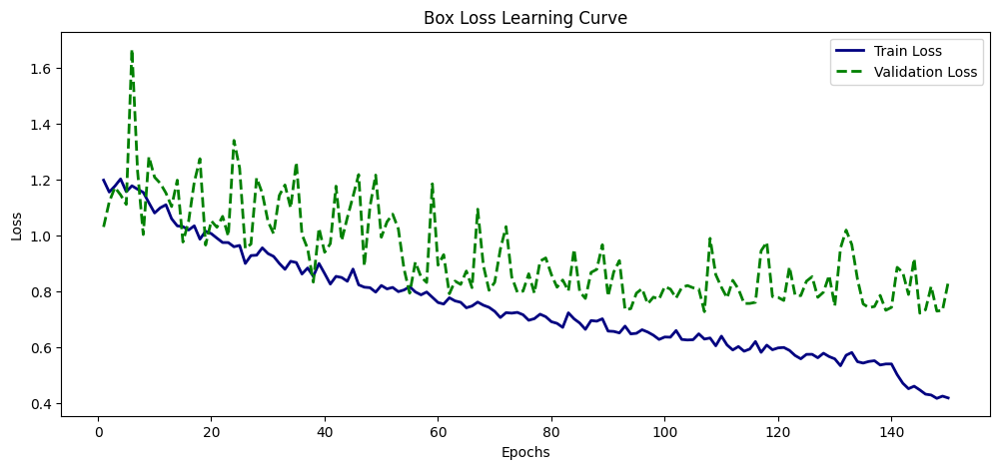

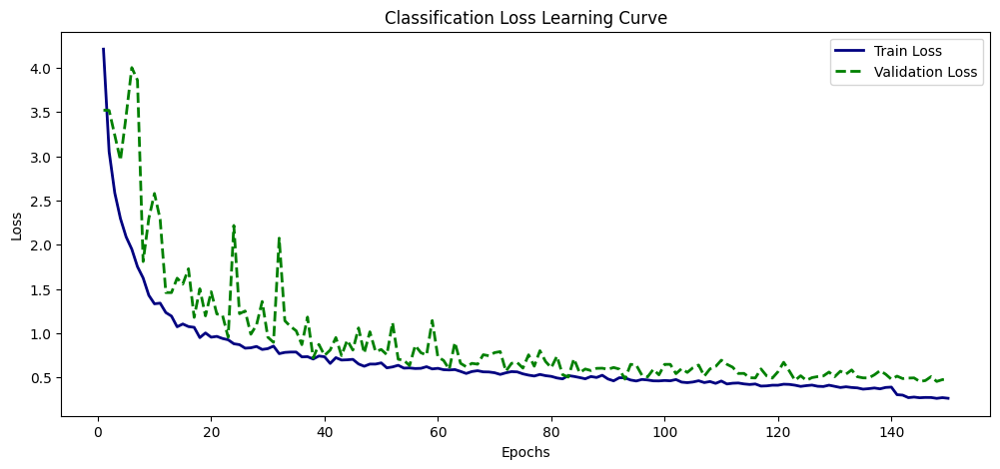

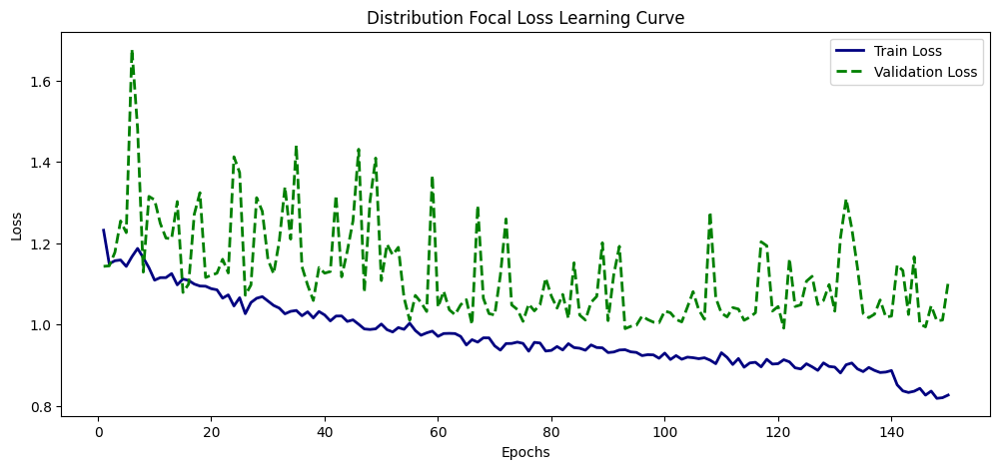

In [11]:
# Create the full file path for 'results.csv' using the directory path and file name
results_csv_path_seg = os.path.join(post_training_files_path_segmentation, 'results.csv')

# Load the CSV file from the constructed path into a pandas DataFrame
df_seg = pd.read_csv(results_csv_path_seg)

# Remove any leading whitespace from the column names
df_seg.columns = df_seg.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df_seg, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df_seg, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df_seg, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')

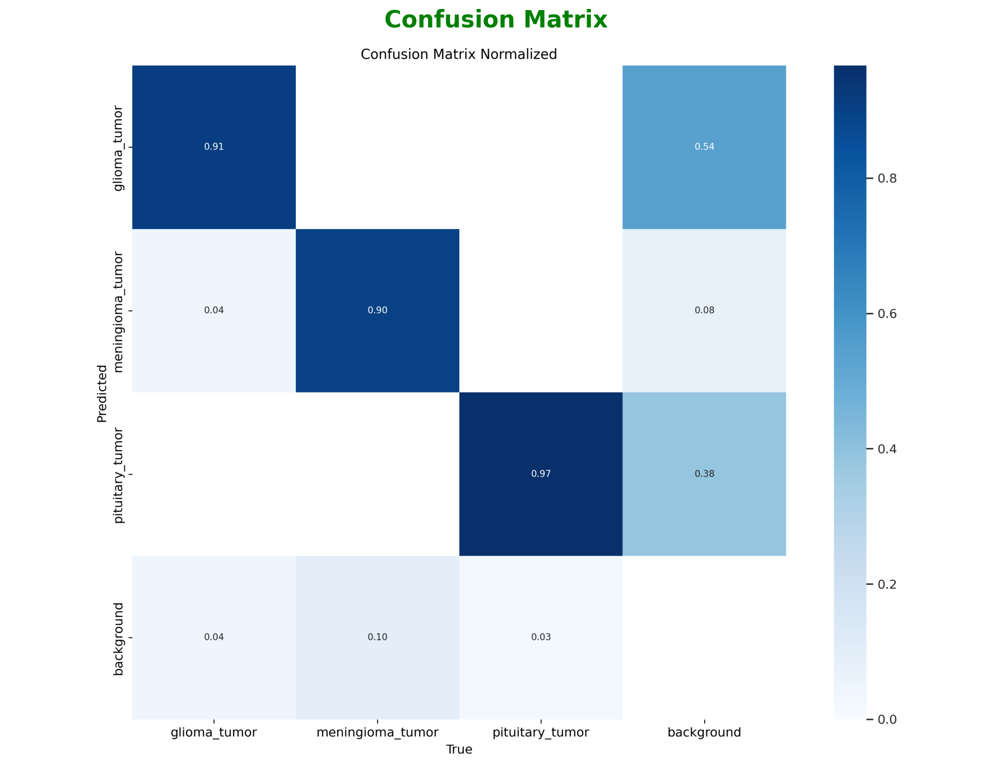

In [12]:
# Construct the path to the normalized confusion matrix image
confusion_matrix_path = os.path.join(post_training_files_path_segmentation, 'confusion_matrix_normalized.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image with enhanced settings
plt.figure(figsize=(12, 12), dpi=150)  # Increase figure size and DPI for better resolution
plt.imshow(cm_img)

# Customize the appearance of the plot
plt.axis('off')  # Hide axes

# Optionally, add a title with larger font size
plt.title("Confusion Matrix ", fontsize=20, fontweight="bold", color='green')

# Show the image with improved display
plt.tight_layout()  # Adjust layout for better spacing
plt.show()



In [13]:
# Construct the path to the best model weights file using os.path.join
best_model_path_seg = os.path.join(post_training_files_path_segmentation, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model_seg = YOLO(best_model_path_seg)

# Validate the best model using the validation set with default parameters
metrics_seg = best_model_seg.val(split='val')

# Convert the dictionary to a pandas DataFrame and use the keys as the index
metrics_df_seg = pd.DataFrame.from_dict(metrics_seg.results_dict, orient='index', columns=['Metric Value'])

# Display the DataFrame
metrics_df_seg.round(3)

Ultralytics 8.3.76 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n-seg summary (fused): 113 layers, 2,835,153 parameters, 0 gradients, 10.2 GFLOPs


val: Scanning /kaggle/working/brain-tumor-Segmentation_yolo11/valid/labels.cache... 133 images, 25 backgrounds, 0 corrupt: 100%|██████████| 133/133 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.71it/s]


                   all        133        117      0.889      0.905      0.955      0.761      0.905      0.915      0.959      0.738
          glioma_tumor         36         45      0.865      0.911      0.957      0.819      0.867      0.911      0.957      0.777
      meningioma_tumor         42         42      0.949      0.905      0.974      0.822       0.95        0.9      0.979      0.809
       pituitary_tumor         30         30      0.854        0.9      0.935      0.643      0.897      0.933       0.94      0.627


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 2.7ms preprocess, 7.8ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/segment/val


,Metric Value
metrics/precision(B),0.889
metrics/recall(B),0.905
metrics/mAP50(B),0.955
metrics/mAP50-95(B),0.761
metrics/precision(M),0.905
metrics/recall(M),0.915
metrics/mAP50(M),0.959
metrics/mAP50-95(M),0.738
fitness,1.541


 <p style="color:black;font-family:newtimeroman;font-size:200%;text-align:center; font-weight:8000"> 📽 VISUALIZATION 📽 </p>


image 1/1 /kaggle/working/brain-tumor-Segmentation_yolo11/test/images/G_368_jpg.rf.a81e63ef983e3e746dd39ed6c21f87ba.jpg: 640x640 1 glioma_tumor, 11.6ms
Speed: 2.1ms preprocess, 11.6ms inference, 25.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/brain-tumor-Segmentation_yolo11/test/images/G_257_jpg.rf.76c9dc133b4823914580452d3a1b457a.jpg: 640x640 (no detections), 9.9ms
Speed: 1.6ms preprocess, 9.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/brain-tumor-Segmentation_yolo11/test/images/G_457_jpg.rf.0786fc82a06007b6e9574ffb185fe498.jpg: 640x640 1 glioma_tumor, 10.2ms
Speed: 1.4ms preprocess, 10.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/working/brain-tumor-Segmentation_yolo11/test/images/M_469_jpg.rf.7fdca6dfcf24ed792babae3451683d9b.jpg: 640x640 1 meningioma_tumor, 10.5ms
Speed: 1.4ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 6

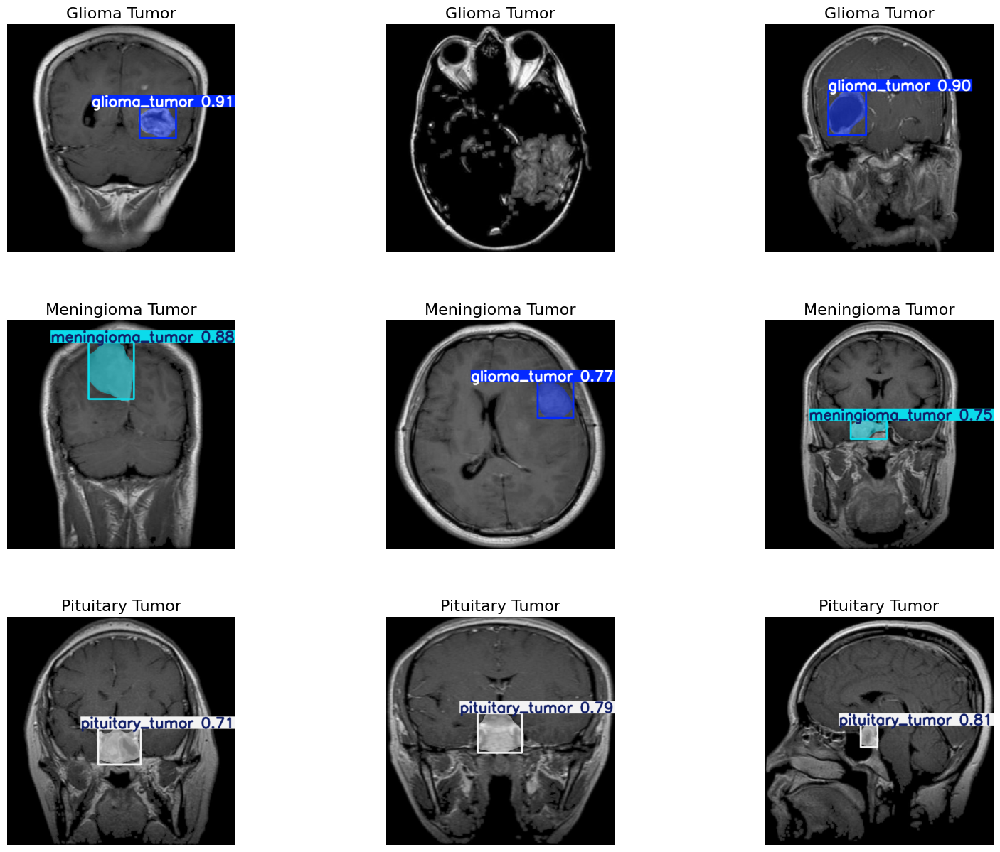

In [16]:
# Path to the test image folder
test_images_path = "/kaggle/working/brain-tumor-Segmentation_yolo11/test/images"

# Define class mapping based on the first capital letter in filenames
class_mapping = {
    "G": "Glioma Tumor",
    "M": "Meningioma Tumor",
    "P": "Pituitary Tumor",
    "N": "Normal"
}

# Collect images by class
image_classes = {cls: [] for cls in class_mapping.keys()}

# Iterate through images and categorize them
for img_name in os.listdir(test_images_path):
    if img_name.endswith(('.jpg', '.png', '.jpeg')):
        class_letter = img_name[0]  # First capital letter
        if class_letter in image_classes:
            image_classes[class_letter].append(img_name)

# Select up to 9 images (3 per row, 3 rows)
selected_images = []
for class_letter, img_list in image_classes.items():
    selected_images.extend([(class_letter, img) for img in img_list[:3]])

# 🔹 Ensure exactly 9 images (duplicate if fewer)
while len(selected_images) < 9:
    selected_images.append(selected_images[len(selected_images) % len(selected_images)])

# Set up figure with 3x3 grid and larger size
fig, axes = plt.subplots(3, 3, figsize=(20, 15))  # Increased figure size

# Flatten axes for easy iteration
axes = axes.flatten()

# Loop through selected images and display them
for idx, (class_letter, img_name) in enumerate(selected_images[:9]):  # 🔹 Only take 9 images
    img_path = os.path.join(test_images_path, img_name)

    # Perform inference for segmentation
    results = best_model_seg.predict(source=img_path, imgsz=640, conf=0.7, task='segment')  # specify task=segment
    
    # Get the annotated image with segmentation masks
    annotated_img = results[0].plot(line_width=4, font_size=15)  # Increased line width and font size for visibility

    # Convert BGR to RGB
    annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)

    # Display image
    axes[idx].imshow(annotated_img)
    axes[idx].axis("off")

    # Set title (optional)
    axes[idx].set_title(f"{class_mapping[class_letter]}", fontsize=16)

# Adjust layout for better spacing between images
plt.subplots_adjust(wspace=0.1, hspace=0.3)

plt.show()


 <p style="color:black;font-family:newtimeroman;font-size:250%;text-align:center; font-weight:8000">✅ we already get suitable results with YOLO11 but for Educational purposes we continue and apply object detection with SSD and Faster R_CNN too ✅ </p>

# <p style="padding:20px;background-color:black;margin:0;color:yellow;font-family:newtimeroman;font-size:120%;text-align:center;border-radius: 15px 500px;overflow:hidden;font-weight:800">🌕 Step 7  | Single shot Detection(SSD)</p>

 <p style="color:black;font-family:newtimeroman;font-size:200%;text-align:left; font-weight:8000"> 🔴 for using SSD and Faster R_cnn we have to use a diffrent foramt of data,in roboflow site you have to Export yourdataset in Pascalvot format so that it can be used this two algorithms. </p>

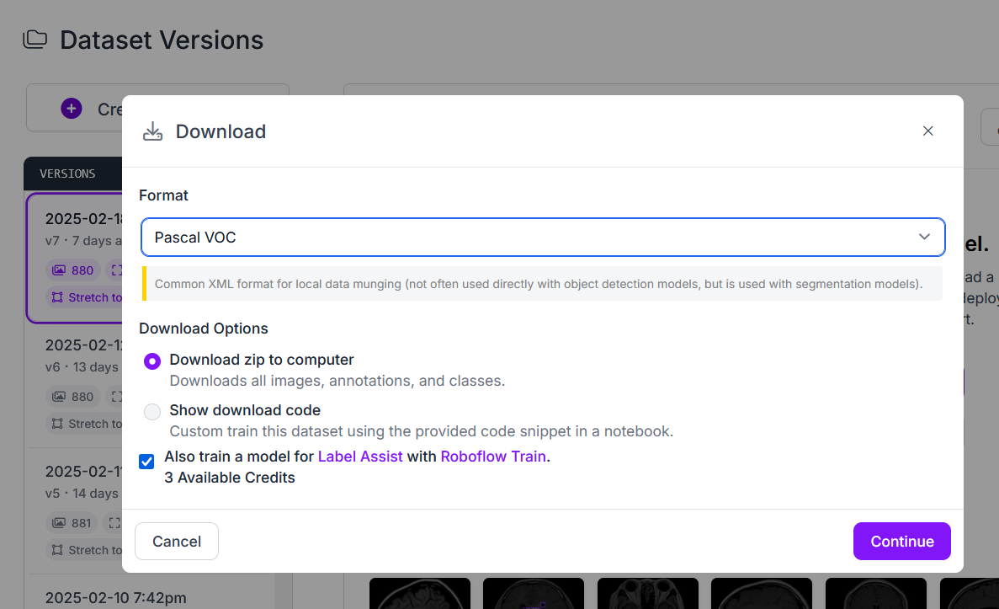

In [3]:
root_dir='/kaggle/input/brain-tumor-object-detectionpascal-voc-format'

class PascalVOCDataset(Dataset):
    def __init__(self, root_dir, transforms=None):
        self.root_dir = root_dir
        self.transforms = transforms

        # List all images
        self.image_files = [f for f in os.listdir(self.root_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

        # Define class labels (0 = background)
        self.class_mapping = {"glioma_tumor": 1, "meningioma_tumor": 2, "pituitary_tumor": 3}  # No "Normal" class!

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.root_dir, img_name)
        xml_path = os.path.join(self.root_dir, img_name.rsplit(".", 1)[0] + ".xml")  # Match image name to XML

        # Load image
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        boxes = []
        labels = []

        # If annotation exists, parse it
        if os.path.exists(xml_path):
            tree = ET.parse(xml_path)
            root = tree.getroot()

            for obj in root.findall("object"):
                class_name = obj.find("name").text
                if class_name not in self.class_mapping:
                    continue

                label = self.class_mapping[class_name]
                bbox = obj.find("bndbox")
                x_min = int(bbox.find("xmin").text)
                y_min = int(bbox.find("ymin").text)
                x_max = int(bbox.find("xmax").text)
                y_max = int(bbox.find("ymax").text)

                boxes.append([x_min, y_min, x_max, y_max])
                labels.append(label)

        # ✅ **If image has no boxes, return an empty tensor (Normal brain = background)**
        if len(boxes) == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)  # Empty box
            labels = torch.zeros((0,), dtype=torch.int64) # No labels

        target = {
            "boxes": torch.as_tensor(boxes, dtype=torch.float32),
            "labels": torch.as_tensor(labels, dtype=torch.int64),
        }

        if self.transforms:
            image = self.transforms(image)

        return image, target


# Define transforms
def get_transform(train=True):
    transforms = [T.ToTensor()]
    if train:
        transforms.append(T.RandomHorizontalFlip(0.000001))  # adjust as you needed
    return T.Compose(transforms)


# Load dataset (Fix the dataset path)
train_dataset = PascalVOCDataset("/kaggle/input/brain-tumor-object-detectionpascal-voc-format/train", transforms=get_transform(train=True))
valid_dataset = PascalVOCDataset("/kaggle/input/brain-tumor-object-detectionpascal-voc-format/valid", transforms=get_transform(train=False))

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
valid_loader = DataLoader(valid_dataset, batch_size=8, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

print(f"✅ Loaded {len(train_dataset)} training images, {len(valid_dataset)} validation images.")


✅ Loaded 704 training images, 133 validation images.


In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ssd300_vgg16(pretrained=True)

# Modify the classification head with dropout
for module in model.head.classification_head.modules():
    if isinstance(module, nn.Linear):
        module.dropout = nn.Dropout(p=0.2)  # Adjust dropout probability
        
model.to(device)

print("✅ SSD Model Loaded & Modified for Pascal VOC!")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SSD300_VGG16_Weights.COCO_V1`. You can also use `weights=SSD300_VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/ssd300_vgg16_coco-b556d3b4.pth" to /root/.cache/torch/hub/checkpoints/ssd300_vgg16_coco-b556d3b4.pth
100%|██████████| 136M/136M [00:00<00:00, 175MB/s] 


✅ SSD Model Loaded & Modified for Pascal VOC!


In [5]:
# Define optimizer & learning rate scheduler
optimizer = optim.Adam(model.parameters(), lr=0.00001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.3, patience=2, verbose=True)

# Early stopping parameters
patience = 1000  # Number of epochs to wait before stopping
best_loss = float('inf')
counter = 0

# Training loop
num_epochs = 20
for epoch in range(num_epochs):
    model.train()
    total_loss = 0

    # Training loop
    loop = tqdm(train_loader, leave=True)
    for images, targets in loop:
        images = list(img.to(device) for img in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        optimizer.zero_grad()
        loss_dict = model(images, targets)

        # 🔹 FIX: Ensure loss_dict is a dictionary before summing the losses
        if isinstance(loss_dict, dict):
            loss = sum(loss for loss in loss_dict.values())
        else:
            loss = torch.tensor(0.0, device=device)  # Handle unexpected outputs safely

        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        loop.set_description(f"Epoch {epoch+1}/{num_epochs}")
        loop.set_postfix(loss=total_loss / len(train_loader))

    avg_train_loss = total_loss / len(train_loader)
    
    # Validation loss calculation
    model.train()
    total_val_loss = 0
    with torch.no_grad():
        for images, targets in valid_loader:
            images = list(img.to(device) for img in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            loss_dict = model(images, targets)

            # 🔹 FIX: Ensure loss_dict is a dictionary before summing the losses
            if isinstance(loss_dict, dict):
                loss = sum(loss for loss in loss_dict.values())
            else:
                loss = torch.tensor(0.0, device=device)  # Handle unexpected outputs safely

            total_val_loss += loss.item()

    avg_val_loss = total_val_loss / len(valid_loader)

    print(f"🔥 Epoch [{epoch+1}/{num_epochs}] - Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f}")

    # Update learning rate based on validation loss
    scheduler.step(avg_val_loss)

    # Early stopping check
    if avg_val_loss < best_loss:
        best_loss = avg_val_loss
        counter = 0  # Reset counter when loss improves
    else:
        counter += 1  # Increase counter if loss does not improve

    if counter >= patience:
        print("🛑 Early stopping triggered! Training stopped.")
        break

print("✅ Training Complete!")


/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
Epoch 1/20: 100%|██████████| 88/88 [00:29<00:00,  2.94it/s, loss=4.79] 


🔥 Epoch [1/20] - Train Loss: 4.7869 | Val Loss: 3.3267


Epoch 2/20: 100%|██████████| 88/88 [00:21<00:00,  4.10it/s, loss=2.92] 


🔥 Epoch [2/20] - Train Loss: 2.9174 | Val Loss: 2.7788


Epoch 3/20: 100%|██████████| 88/88 [00:21<00:00,  4.01it/s, loss=2.26] 


🔥 Epoch [3/20] - Train Loss: 2.2563 | Val Loss: 2.5473


Epoch 4/20: 100%|██████████| 88/88 [00:21<00:00,  4.06it/s, loss=1.85] 


🔥 Epoch [4/20] - Train Loss: 1.8533 | Val Loss: 2.4621


Epoch 5/20: 100%|██████████| 88/88 [00:21<00:00,  4.12it/s, loss=1.57] 


🔥 Epoch [5/20] - Train Loss: 1.5659 | Val Loss: 2.3995


Epoch 6/20: 100%|██████████| 88/88 [00:21<00:00,  4.17it/s, loss=1.35] 


🔥 Epoch [6/20] - Train Loss: 1.3531 | Val Loss: 2.3172


Epoch 7/20: 100%|██████████| 88/88 [00:21<00:00,  4.15it/s, loss=1.17] 


🔥 Epoch [7/20] - Train Loss: 1.1704 | Val Loss: 2.3585


Epoch 8/20: 100%|██████████| 88/88 [00:21<00:00,  4.09it/s, loss=1.04] 


🔥 Epoch [8/20] - Train Loss: 1.0370 | Val Loss: 2.4255


Epoch 9/20: 100%|██████████| 88/88 [00:21<00:00,  4.16it/s, loss=0.923]


🔥 Epoch [9/20] - Train Loss: 0.9232 | Val Loss: 2.3943


Epoch 10/20: 100%|██████████| 88/88 [00:20<00:00,  4.20it/s, loss=0.825] 


🔥 Epoch [10/20] - Train Loss: 0.8252 | Val Loss: 2.3947


Epoch 11/20: 100%|██████████| 88/88 [00:21<00:00,  4.17it/s, loss=0.792] 


🔥 Epoch [11/20] - Train Loss: 0.7920 | Val Loss: 2.4284


Epoch 12/20: 100%|██████████| 88/88 [00:21<00:00,  4.14it/s, loss=0.761] 


🔥 Epoch [12/20] - Train Loss: 0.7612 | Val Loss: 2.4546


Epoch 13/20: 100%|██████████| 88/88 [00:21<00:00,  4.13it/s, loss=0.73]  


🔥 Epoch [13/20] - Train Loss: 0.7300 | Val Loss: 2.4718


Epoch 14/20: 100%|██████████| 88/88 [00:21<00:00,  4.14it/s, loss=0.738] 


🔥 Epoch [14/20] - Train Loss: 0.7380 | Val Loss: 2.4825


Epoch 15/20: 100%|██████████| 88/88 [00:21<00:00,  4.12it/s, loss=0.722] 


🔥 Epoch [15/20] - Train Loss: 0.7223 | Val Loss: 2.4942


Epoch 16/20: 100%|██████████| 88/88 [00:21<00:00,  4.17it/s, loss=0.701] 


🔥 Epoch [16/20] - Train Loss: 0.7015 | Val Loss: 2.4971


Epoch 17/20: 100%|██████████| 88/88 [00:21<00:00,  4.18it/s, loss=0.71] 


🔥 Epoch [17/20] - Train Loss: 0.7095 | Val Loss: 2.4976


Epoch 18/20: 100%|██████████| 88/88 [00:21<00:00,  4.16it/s, loss=0.705] 


🔥 Epoch [18/20] - Train Loss: 0.7046 | Val Loss: 2.5013


Epoch 19/20: 100%|██████████| 88/88 [00:21<00:00,  4.18it/s, loss=0.719] 


🔥 Epoch [19/20] - Train Loss: 0.7188 | Val Loss: 2.5018


Epoch 20/20: 100%|██████████| 88/88 [00:21<00:00,  4.18it/s, loss=0.71]  


🔥 Epoch [20/20] - Train Loss: 0.7095 | Val Loss: 2.5024
✅ Training Complete!


 <p style="color:black;font-family:newtimeroman;font-size:250%;text-align:center; font-weight:8000"> 🎯 EVALUATION 🎯 </p>

In [11]:
# Define IoU threshold for evaluation
iou_threshold = 0.5

def evaluate_model(test_dataloader, model, device, iou_threshold=0.5):
    model.eval()  # Use eval mode for inference
    total_true_positives = 0
    total_false_positives = 0
    total_ground_truths = 0
    all_precisions = []
    all_recalls = []
    
    with torch.no_grad():
        for images, targets in test_dataloader:
            images = [img.to(device) for img in images]
            # Keep targets on CPU for metric computation (or move them if needed)
            outputs = model(images)  # Inference without targets
            
            for output, target in zip(outputs, targets):
                # Skip images without ground truth boxes (i.e. "normal" images)
                gt_boxes = target["boxes"].cpu().numpy()
                if len(gt_boxes) == 0:
                    continue
                
                pred_boxes = output["boxes"].cpu().numpy()
                pred_scores = output["scores"].cpu().numpy()
                pred_labels = output["labels"].cpu().numpy()
                
                total_ground_truths += len(gt_boxes)
                
                # If there are no predictions, skip this image
                if len(pred_boxes) == 0:
                    continue
                
                # Compute IoU between predicted and ground-truth boxes
                iou_matrix = box_iou(torch.as_tensor(pred_boxes), torch.as_tensor(gt_boxes))
                
                # For each predicted box, check if max IoU is above threshold
                max_ious = iou_matrix.max(dim=1)[0]
                true_positives = (max_ious >= iou_threshold).sum().item()
                false_positives = len(pred_boxes) - true_positives
                
                total_true_positives += true_positives
                total_false_positives += false_positives
                
                precision = true_positives / (true_positives + false_positives + 1e-6)
                recall = true_positives / (len(gt_boxes) + 1e-6)
                all_precisions.append(precision)
                all_recalls.append(recall)
    
    mean_precision = np.mean(all_precisions) if all_precisions else 0.0
    mean_recall = np.mean(all_recalls) if all_recalls else 0.0
    f1_score = 2 * (mean_precision * mean_recall) / (mean_precision + mean_recall + 1e-6) if (mean_precision + mean_recall) > 0 else 0.0

    print(f"📊 Evaluation Results:")
    print(f"   Precision: {mean_precision:.4f}")
    print(f"   Recall:    {mean_recall:.4f}")
    print(f"   F1 Score:  {f1_score:.4f}")
    print(f"   True Positives: {total_true_positives}")
    print(f"   False Positives: {total_false_positives}")
    print(f"   Total Ground Truths: {total_ground_truths}")


# Now, load your test dataset using your PascalVOCDataset (which returns image and target)
test_dataset = PascalVOCDataset("/kaggle/input/brain-tumor-object-detectionpascal-voc-format/test", transforms=T.Compose([T.ToTensor()]))
test_dataloader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

evaluate_model(test_dataloader, model, device, iou_threshold=0.5)



📊 Evaluation Results:
   Precision: 0.2140
   Recall:    1.8659
   F1 Score:  0.3839
   True Positives: 80
   False Positives: 861
   Total Ground Truths: 43


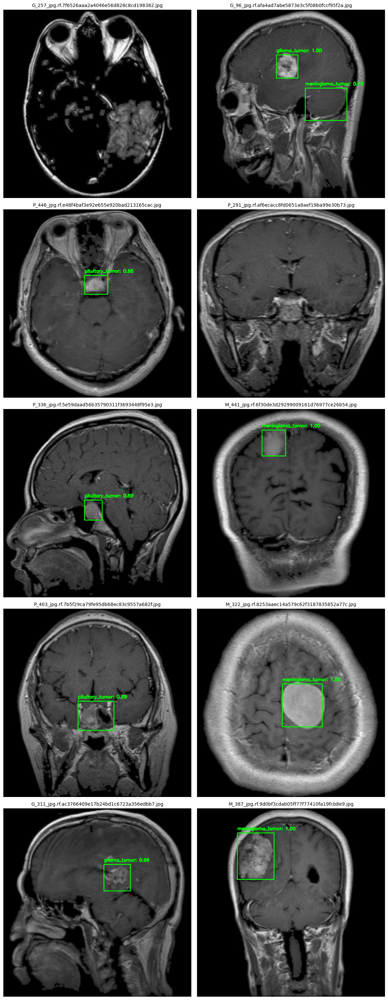

In [12]:
# Define the test image folder path (update as needed)
test_images_path = "/kaggle/input/brain-tumor-object-detectionpascal-voc-format/test"

# Define a simple transformation for testing (only convert to tensor)
test_transform = T.Compose([T.ToTensor()])

# Ensure model is in evaluation mode and on the proper device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

def run_inference(image_path, transform, model, device, score_threshold=0.5):
    # Read image using OpenCV
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    orig = img_rgb.copy()
    
    # Apply transformation
    image_tensor = transform(img_rgb).to(device)
    image_tensor = image_tensor.unsqueeze(0)  # Add batch dimension
    
    # Run inference
    with torch.no_grad():
        outputs = model(image_tensor)
    
    outputs = outputs[0]
    boxes = outputs['boxes'].cpu().numpy()
    scores = outputs['scores'].cpu().numpy()
    labels = outputs['labels'].cpu().numpy()
    
    # Filter out detections below score threshold
    keep = scores >= score_threshold
    boxes = boxes[keep]
    scores = scores[keep]
    labels = labels[keep]
    
    return orig, boxes, scores, labels

# Get test images
test_images = [f for f in os.listdir(test_images_path) if f.lower().endswith(('.jpg','.png','.jpeg'))]
num_display = min(10, len(test_images))  # Number of images to display

# Define a mapping for class names (should match your training mapping)
class_mapping = {0: "background", 1: "glioma_tumor", 2: "meningioma_tumor", 3: "pituitary_tumor"}

# Determine grid dimensions: 2 columns, compute rows accordingly
cols = 2
rows = (num_display + cols - 1) // cols  # Ceiling division

fig, axes = plt.subplots(rows, cols, figsize=(12, 6*rows))  # Adjust figure size as needed

# Flatten axes for easy iteration (if rows*cols > 1)
if rows * cols > 1:
    axes = axes.flatten()
else:
    axes = [axes]

for i, img_name in enumerate(test_images[:num_display]):
    image_path = os.path.join(test_images_path, img_name)
    orig, boxes, scores, labels = run_inference(image_path, test_transform, model, device, score_threshold=0.5)
    
    # Draw bounding boxes on the image
    for box, score, label in zip(boxes, scores, labels):
        x_min, y_min, x_max, y_max = box.astype(int)
        cv2.rectangle(orig, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
        text = f"{class_mapping.get(label, 'N/A')}: {score:.2f}"
        cv2.putText(orig, text, (x_min, max(y_min-10, 10)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    
    axes[i].imshow(orig)
    axes[i].set_title(img_name, fontsize=10)
    axes[i].axis("off")

# Turn off any unused subplots
for j in range(i+1, rows*cols):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


 <p style="color:black;font-family:newtimeroman;font-size:250%;text-align:center; font-weight:8000"> 🟡 metrics for SSD in this data wasnt good enough.we used VGG16 as pretrained backbone ,but in Faster R_CNN i am going to use EFFICIENT_NET B3 🟡 </p>

# <p style="padding:20px;background-color:black;margin:0;color:yellow;font-family:newtimeroman;font-size:120%;text-align:center;border-radius: 15px 500px;overflow:hidden;font-weight:800">🌕 Step 8  | Faster R_CNN</p>

In [1]:
# Load EfficientNet-B3 pretrained on ImageNet
efficientnet = efficientnet_b3(weights="IMAGENET1K_V1")

return_nodes = {
    "features.2": "feat1",
    "features.4": "feat2",
    "features.6": "feat3",
    "features.8": "feat4",
}

# Create a feature extractor.
backbone_extractor = create_feature_extractor(efficientnet, return_nodes=return_nodes)

Downloading: "https://download.pytorch.org/models/efficientnet_b3_rwightman-b3899882.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b3_rwightman-b3899882.pth
100%|██████████| 47.2M/47.2M [00:00<00:00, 149MB/s] 


In [3]:
# Set in_channels based on your inspection.
in_channels_list = [32, 96, 232, 1536]

# Create an FPN.
fpn_out_channels = 256
fpn = FeaturePyramidNetwork(in_channels_list=in_channels_list, out_channels=fpn_out_channels)

# Create an anchor generator. One tuple per feature map.
anchor_sizes = ((32,), (64,), (128,), (256,))
aspect_ratios = ((0.5, 1.0, 2.0),) * 4
anchor_generator = AnchorGenerator(sizes=anchor_sizes, aspect_ratios=aspect_ratios)

# Define custom backbone.
class EfficientNetBackbone(nn.Module):
    def __init__(self, feature_extractor, fpn, return_nodes):
        super().__init__()
        self.feature_extractor = feature_extractor
        self.fpn = fpn
        self.return_nodes = return_nodes

    def forward(self, x):
        features = self.feature_extractor(x)
        feature_list = [features[node] for node in sorted(features.keys())]
        fpn_input = OrderedDict()
        for i, feature in enumerate(feature_list):
            fpn_input[str(i)] = feature
        fpn_output = self.fpn(fpn_input)
        ordered_output = OrderedDict()
        for i, (k, feat) in enumerate(fpn_output.items()):
            ordered_output[str(i)] = feat
        return ordered_output

custom_backbone = EfficientNetBackbone(backbone_extractor, fpn, return_nodes)
custom_backbone.out_channels = fpn_out_channels

# Define number of classes: background (0) + 3 tumor classes = 4.
num_classes = 4

# Create the Faster R-CNN model.
model = FasterRCNN(custom_backbone, num_classes=num_classes, rpn_anchor_generator=anchor_generator)

# ------------------------------
# 2. Improve Classification Part
# ------------------------------
# Freeze backbone parameters.
for param in model.backbone.parameters():
    param.requires_grad = False

# Reinitialize the ROI head (box predictor).
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# ------------------------------
# 3. Device Setup
# ------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
print("✅ Faster R-CNN with EfficientNet-B3 Backbone Constructed!")

✅ Faster R-CNN with EfficientNet-B3 Backbone Constructed!


In [4]:
# ------------------------------
# 4. Dataset & Transforms
# ------------------------------
class PascalVOCDataset(Dataset):
    def __init__(self, root_dir, transforms=None):
        self.root_dir = root_dir
        self.transforms = transforms
        self.image_files = [f for f in os.listdir(self.root_dir) if f.lower().endswith(('.jpg', '.png', '.jpeg'))]
        self.class_mapping = {"glioma_tumor": 1, "meningioma_tumor": 2, "pituitary_tumor": 3}
    
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.root_dir, img_name)
        xml_path = os.path.join(self.root_dir, img_name.rsplit(".", 1)[0] + ".xml")
        
        # Load image with OpenCV.
        image = cv2.imread(img_path)
        if image is None:
            raise ValueError(f"🚨 Image not found or cannot be read: {img_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if len(image.shape) == 2:
            image = cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)
        elif image.shape[-1] != 3:
            image = cv2.merge([image, image, image])
        image = Image.fromarray(image)
        
        boxes = []
        labels = []
        if os.path.exists(xml_path):
            tree = ET.parse(xml_path)
            root = tree.getroot()
            for obj in root.findall("object"):
                class_name = obj.find("name").text.strip().lower()
                if class_name not in self.class_mapping:
                    continue
                label = self.class_mapping[class_name]
                bbox = obj.find("bndbox")
                x_min = int(bbox.find("xmin").text)
                y_min = int(bbox.find("ymin").text)
                x_max = int(bbox.find("xmax").text)
                y_max = int(bbox.find("ymax").text)
                boxes.append([x_min, y_min, x_max, y_max])
                labels.append(label)
        if len(boxes) == 0:
            boxes = torch.empty((0, 4), dtype=torch.float32)
            labels = torch.empty((0,), dtype=torch.int64)
        else:
            boxes = torch.as_tensor(boxes, dtype=torch.float32)
            labels = torch.as_tensor(labels, dtype=torch.int64)
        target = {"boxes": boxes, "labels": labels}
        if self.transforms:
            image = self.transforms(image)
        return image, target

def get_transform(train=True):
    trans = []
    if train:
        trans.append(T.RandomHorizontalFlip(0.000001))
    trans.append(T.ToTensor())
    return T.Compose(trans)

train_dataset = PascalVOCDataset("/kaggle/input/brain-tumor-object-detectionpascal-voc-format/train", transforms=get_transform(train=True))
valid_dataset = PascalVOCDataset("/kaggle/input/brain-tumor-object-detectionpascal-voc-format/valid", transforms=get_transform(train=False))

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
valid_loader = DataLoader(valid_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

In [5]:
# ------------------------------
class EarlyStopping:
    def __init__(self, patience=10, delta=0, restore_best_weights=True):
        self.patience = patience
        self.delta = delta
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.best_model_weights = None
        self.best_epoch = 0
        self.restore_best_weights = restore_best_weights

    def __call__(self, val_loss, model, current_epoch):
        score = -val_loss  # We minimize validation loss.
        if self.best_score is None:
            self.best_score = score
            self.best_model_weights = model.state_dict()
            self.best_epoch = current_epoch
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.best_model_weights = model.state_dict()
            self.best_epoch = current_epoch
            self.counter = 0

    def restore_weights(self, model):
        if self.restore_best_weights and self.best_model_weights is not None:
            model.load_state_dict(self.best_model_weights)

class ReduceLROnPlateau:
    def __init__(self, optimizer, mode='min', factor=0.2, patience=3, min_lr=1e-5, verbose=True):
        self.optimizer = optimizer
        self.mode = mode
        self.factor = factor
        self.patience = patience
        self.min_lr = min_lr
        self.verbose = verbose
        self.counter = 0
        self.best_score = None

    def step(self, metric):
        if self.best_score is None or (self.mode == 'min' and metric < self.best_score) or (self.mode == 'max' and metric > self.best_score):
            self.best_score = metric
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.reduce_lr()

    def reduce_lr(self):
        for param_group in self.optimizer.param_groups:
            new_lr = max(param_group['lr'] * self.factor, self.min_lr)
            if param_group['lr'] > new_lr:
                param_group['lr'] = new_lr
                if self.verbose:
                    print(f"🔻 Learning rate reduced to {new_lr:.6f}")
        self.counter = 0

# Set up optimizer: separate ROI head from others.
detector_params = list(model.roi_heads.box_predictor.parameters())
other_params = [param for name, param in model.named_parameters() if "roi_heads.box_predictor" not in name]

optimizer = optim.Adam([
    {"params": detector_params, "lr": 0.001},
    {"params": other_params, "lr": 0.0001},
])
lr_scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=3, min_lr=1e-5, verbose=True)

epochs = 10
early_stopping = EarlyStopping(patience=10, restore_best_weights=True)

for epoch in range(epochs):
    model.train()
    total_train_loss = 0
    train_loop = tqdm(train_loader, leave=True)
    for images, targets in train_loop:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        optimizer.zero_grad()
        loss_dict = model(images, targets)
        loss = sum(loss for loss in loss_dict.values())
        loss.backward()
        optimizer.step()
        total_train_loss += loss.item()
        train_loop.set_postfix(loss=total_train_loss / len(train_loader))
    avg_train_loss = total_train_loss / len(train_loader)

    model.train()
    total_val_loss = 0
    with torch.no_grad():
        for images, targets in valid_loader:
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            loss_dict = model(images, targets)
            loss = sum(loss for loss in loss_dict.values())
            total_val_loss += loss.item()
    avg_val_loss = total_val_loss / len(valid_loader)
    print(f"Epoch {epoch+1}/{epochs} - Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")
    lr_scheduler.step(avg_val_loss)
    early_stopping(avg_val_loss, model, epoch+1)
    if early_stopping.early_stop:
        print(f"🚨 Early stopping at epoch {epoch+1}")
        break

early_stopping.restore_weights(model)
print(f"✅ Best epoch: {early_stopping.best_epoch}")
torch.save(model.state_dict(), "best_fasterrcnn.pth")
print("📁 Best model saved as best_fasterrcnn.pth")

100%|██████████| 176/176 [00:50<00:00,  3.52it/s, loss=0.176]


Epoch 1/10 - Train Loss: 0.1756, Val Loss: 0.1028


100%|██████████| 176/176 [00:39<00:00,  4.42it/s, loss=0.1]   


Epoch 2/10 - Train Loss: 0.1003, Val Loss: 0.0972


100%|██████████| 176/176 [00:40<00:00,  4.36it/s, loss=0.0996]


Epoch 3/10 - Train Loss: 0.0996, Val Loss: 0.1129


100%|██████████| 176/176 [00:40<00:00,  4.38it/s, loss=0.0933]


Epoch 4/10 - Train Loss: 0.0933, Val Loss: 0.1112


100%|██████████| 176/176 [00:40<00:00,  4.40it/s, loss=0.0915]


Epoch 5/10 - Train Loss: 0.0915, Val Loss: 0.1008
🔻 Learning rate reduced to 0.000200
🔻 Learning rate reduced to 0.000020


100%|██████████| 176/176 [00:40<00:00,  4.37it/s, loss=0.0767]


Epoch 6/10 - Train Loss: 0.0767, Val Loss: 0.0986


100%|██████████| 176/176 [00:40<00:00,  4.35it/s, loss=0.0748]


Epoch 7/10 - Train Loss: 0.0748, Val Loss: 0.0916


100%|██████████| 176/176 [00:40<00:00,  4.36it/s, loss=0.0727]


Epoch 8/10 - Train Loss: 0.0727, Val Loss: 0.0902


100%|██████████| 176/176 [00:40<00:00,  4.36it/s, loss=0.069] 


Epoch 9/10 - Train Loss: 0.0690, Val Loss: 0.0957


100%|██████████| 176/176 [00:40<00:00,  4.35it/s, loss=0.0658]


Epoch 10/10 - Train Loss: 0.0658, Val Loss: 0.0959
✅ Best epoch: 8
📁 Best model saved as best_fasterrcnn.pth


 <p style="color:black;font-family:newtimeroman;font-size:250%;text-align:center; font-weight:8000"> 🟡 val_loss in faster R_cnn with efficientnet b3 backbone was pretty good. 🟡 </p>

<p style="color:navy; font-family:newtimeroman; font-size:180%; text-align:left; font-weight:800;">
🎯 YOLO METRICS Guide
</p>

<table style="width:100%; border-collapse:separate; border-spacing:0 15px; font-family:newtimeroman; font-size:130%; color:black;">
  <tr>
    <td style="font-weight:bold; padding:10px;">🔵 Confidence Threshold</td>
    <td style="padding:10px;">This is a cutoff value for the detection “score” that a model assigns to each predicted bounding box.
A predicted box must have a confidence score higher than this threshold to be considered a valid detection.
For example, if the threshold is 0.5, only boxes with a score of 0.5 or higher are kept; boxes with lower scores are discarded.
It helps filter out uncertain detections and reduce false positives</td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:10px;">🔵 IoU Threshold (Intersection over Union Threshold)</td>
    <td style="padding:10px;">IoU is a measure of how much two bounding boxes overlap.
The IoU threshold is used in processes like Non-Maximum Suppression (NMS) or evaluation:
    In NMS, if two boxes overlap more than the IoU threshold, the one with the lower confidence is suppressed.
    In evaluation, a predicted box is considered a correct detection if its IoU with a ground truth box is above this threshold.

For example, an IoU threshold of 0.5 means that the predicted and ground truth boxes must overlap by at least 50% to be considered a match.
This threshold helps control the balance between merging duplicate detections and keeping distinct object)</td>
  </tr>
  </tr>
</table>


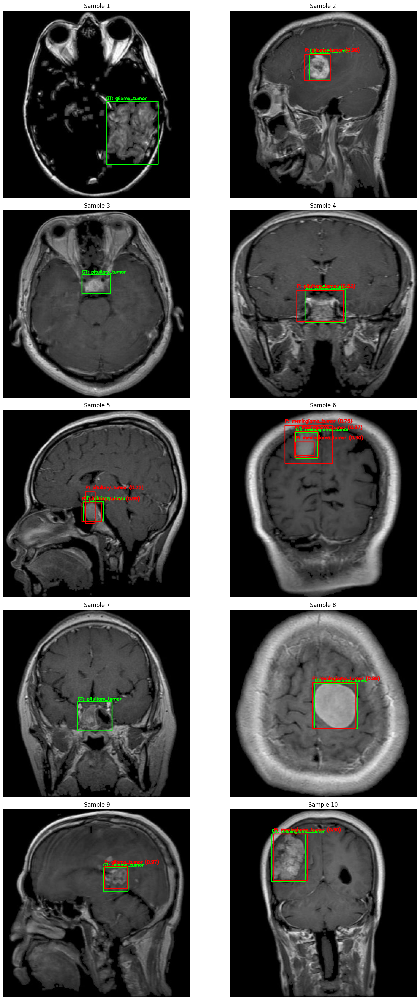

📊 Precision: 0.6275, Recall: 0.7442, F1 Score: 0.6809


In [22]:
class_mapping = {"glioma_tumor": 1, "meningioma_tumor": 2, "pituitary_tumor": 3}
rev_mapping = {v: k for k, v in class_mapping.items()}

eval_dataset = PascalVOCDataset("/kaggle/input/brain-tumor-object-detectionpascal-voc-format/test", transforms=T.Compose([T.ToTensor()]))
eval_loader = DataLoader(eval_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

model.eval()
CONFIDENCE_THRESHOLD = 0.7
IOU_THRESHOLD = 0.75

all_preds = []
all_targets = []

with torch.no_grad():
    for images, targets in eval_loader:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        outputs = model(images)
        for output, target in zip(outputs, targets):
            scores = output["scores"]
            boxes = output["boxes"]
            labels = output["labels"]
            keep = scores > CONFIDENCE_THRESHOLD
            boxes, labels, scores = boxes[keep], labels[keep], scores[keep]
            if boxes.numel() > 0:
                keep = nms(boxes, scores, IOU_THRESHOLD)
                boxes, labels, scores = boxes[keep], labels[keep], scores[keep]
            all_preds.append({"boxes": boxes.cpu().numpy(), "labels": labels.cpu().numpy(), "scores": scores.cpu().numpy()})
            all_targets.append({"boxes": target["boxes"].cpu().numpy(), "labels": target["labels"].cpu().numpy()})

def draw_detections(image, pred_boxes, pred_labels, pred_scores, gt_boxes, gt_labels):
    image_np = image.permute(1, 2, 0).cpu().numpy()
    image_np = (image_np * 255).astype(np.uint8)
    image_np = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    for box, label in zip(gt_boxes, gt_labels):
        x1, y1, x2, y2 = map(int, box)
        cv2.rectangle(image_np, (x1, y1), (x2, y2), (0, 255, 0), 2)
        label_name = rev_mapping.get(label, str(label))
        cv2.putText(image_np, f"GT: {label_name}", (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
    for box, label, score in zip(pred_boxes, pred_labels, pred_scores):
        x1, y1, x2, y2 = map(int, box)
        cv2.rectangle(image_np, (x1, y1), (x2, y2), (0, 0, 255), 2)
        label_name = rev_mapping.get(label, str(label))
        cv2.putText(image_np, f"P: {label_name} ({score:.2f})", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)
    image_np = cv2.cvtColor(image_np, cv2.COLOR_BGR2RGB)
    return image_np

num_samples = 10
ncols = 2
nrows = (num_samples + 1) // ncols
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, nrows*6))
axes = axes.flatten()
for i in range(num_samples):
    img, _ = eval_dataset[i]
    drawn_img = draw_detections(
        img, 
        all_preds[i]["boxes"], 
        all_preds[i]["labels"], 
        all_preds[i]["scores"], 
        all_targets[i]["boxes"], 
        all_targets[i]["labels"]
    )
    axes[i].imshow(drawn_img)
    axes[i].axis("off")
    axes[i].set_title(f"Sample {i+1}")
for j in range(i+1, len(axes)):
    axes[j].axis("off")
plt.tight_layout()
plt.show()

def compute_iou(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])
    inter_area = max(0, x2 - x1) * max(0, y2 - y1)
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union_area = box1_area + box2_area - inter_area
    return inter_area / union_area if union_area else 0

def compute_map(all_preds, all_targets, iou_threshold=0.5):
    total_tp, total_fp, total_fn = 0, 0, 0
    for pred, target in zip(all_preds, all_targets):
        pred_boxes, pred_labels = pred["boxes"], pred["labels"]
        target_boxes, target_labels = target["boxes"], target["labels"]
        matched = set()
        for pb, pl in zip(pred_boxes, pred_labels):
            best_iou = 0
            best_idx = -1
            for idx, (tb, tl) in enumerate(zip(target_boxes, target_labels)):
                if idx in matched or pl != tl:
                    continue
                iou = compute_iou(pb, tb)
                if iou > best_iou:
                    best_iou = iou
                    best_idx = idx
            if best_iou > iou_threshold:
                matched.add(best_idx)
                total_tp += 1
            else:
                total_fp += 1
        total_fn += len(target_boxes) - len(matched)
    precision = total_tp / (total_tp + total_fp) if (total_tp + total_fp) > 0 else 0
    recall = total_tp / (total_tp + total_fn) if (total_tp + total_fn) > 0 else 0
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    return precision, recall, f1_score

precision, recall, f1 = compute_map(all_preds, all_targets)
print(f"📊 Precision: {precision:.4f}, Recall: {recall:.4f}, F1 Score: {f1:.4f}")

 <p style="color:black;font-family:newtimeroman;font-size:250%;text-align:center; font-weight:8000"> ✅ for getting maximum amount of RECALL and f1score you can adjust CONFIDENCE_threshold and IOU_threshold ,but here we just wanted to show the results of using Faster R_CNN for educational purposes.OVERALL in this kind of datas,implementation of YOLO models are much easiear and in many casies are more faster and more ACCURATE ✅ </p>

 <p style="padding:10px;background-color:green;margin:200;color:black;font-family:newtimeroman;font-size:200%;text-align:center;border-radius: 1500px 500px;overflow:hidden;font-weight:8000">Thanks for supporting me by upvotes😍🤝</p>